# Prediction of impurity in a mining process

Metals and minerals industry forms an essential component of any nation's economic growth and sustainability. Canada ranks in the top five producing countries for 13 major minerals and metals, including potash, uranium, niobium, nickel, cobalt, aluminum, platinum group metals, gold and diamonds.

Iron is one those metals whose mining and refining takes place in provinces like Nunavut, Newfoundland, Labrador and Quebec. Moreover this metal is a major component almost every item of value, be it infrastructure materials, manufacturing equipment, vehicles or even household items like utensils.

One of the processes used for refining this metal is froth flotation. Following analysis deals with such a froth flotation process with information on several process variables like column level, air flow, flow rates of different materials in the process, raw material purity, etc.

The whole idea behind this analysis is to enable prediction of the impurity concentration in the final product, using predictive modelling techniques involving machine learning methods.

### Key questions

1) Is it possible to predict % Silica Concentrate every minute?

2) How many steps (hours) ahead can we predict % Silica in Concentrate? This would help engineers to act in predictive and optimized way, mitigating the % of iron that could have gone to tailings.

3) Is it possible to predict % Silica in Concentrate without using % Iron Concentrate column (as they are highly correlated)?

## 1. Gathering necessary libraries and data

Importing the required libraries.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from statsmodels.api import OLS
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime  
from datetime import timedelta
from scipy.signal import find_peaks
from scipy.stats import ks_2samp
from scipy.stats import kstest
import seaborn as sns
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import learning_curve
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit

Reading the data file, obtained from kaggle.

In [2]:
df = pd.read_csv("MiningProcess_Flotation_Plant_Database.csv")

## 2. Data pre-processing + Exploratory Data Analysis

It was found that the column names include spaces, therefore the spaces were replaced by '_'.

In [3]:
col_list = list(df.columns)
col_list_new = [x.replace(' ','_') for x in col_list]
df.columns = col_list_new

Further, the values in the table conatained ',' instead of '.' for decimal. The necassary repalcements were made.

In [4]:
for col in list(df.columns):
    df[col] = df[col].apply(lambda x: x.replace(',','.'))

The first column contains date and time of the sample. Therefore these were converted to the datetime format in pandas for easier interpretation.

In [5]:
df['date'] = pd.to_datetime(df['date'], yearfirst=True, infer_datetime_format=True)

The remaining columns contained data as string values. Therefore, those were converted to numeric (float64 by default).

In [6]:
for col in list(df.columns)[1:]:
    df[col] = pd.to_numeric(df[col])

In [7]:
'''
plt.figure(figsize = (25,5))
plt.scatter(df['%_Silica_Feed'], df['%_Silica_Concentrate'])
plt.title('Plot of % silica in the final concentrate vs the feed')
plt.xlabel('%_Silica_Feed')
plt.ylabel('%_Silica_Concentrate')
'''

"\nplt.figure(figsize = (25,5))\nplt.scatter(df['%_Silica_Feed'], df['%_Silica_Concentrate'])\nplt.title('Plot of % silica in the final concentrate vs the feed')\nplt.xlabel('%_Silica_Feed')\nplt.ylabel('%_Silica_Concentrate')\n"

Since the variables have different ranges, they were scaled down to a range of [0,1] to obtain more balanced models during later stages. This was done using MinMaxScaler from sklearn.

In [8]:
scaler = MinMaxScaler()
scaler.fit(df[df.columns[1:]])

df[df.columns[1:]] = scaler.transform(df[df.columns[1:]])

The final variable to be predicted is % silica in the concentrate. This was stored as a pandas Series 'y'.

In [9]:
y = df['%_Silica_Concentrate']

The dimension of the data set.

In [10]:
df.shape

(737453, 24)

On careful observation of the dataset, it was seen that the sampling timepoints are distributed over 1 hour intervals, though there seem to be around 180 reading for each hour (probably corresponding to readings taken every 20 seconds or so).

Therefore, it was thought to be useful to look at a one hour window for some preliminary insight into the dataset. A unique list of timestamps were obtained from the 'date' column.

In [11]:
dates = list(df.date)

unique_time = []
counts = df.date.value_counts()
i = 0
while i < len(dates):
    unique_time.append(dates[i])
    i = i+counts[dates[i]]
    #print(i)

In [12]:
unique_time[-1], len(dates), dates[-1]

(Timestamp('2017-09-09 23:00:00'), 737453, Timestamp('2017-09-09 23:00:00'))

A slice of the dataframe containing readings corresponding to the first hour was taken.

In [13]:
df1 = df[df['date'] == unique_time[0]]

On close observation it was found that some of the variables do not change within the hour and hence have a single value throughout, e.g. '%_Iron_Feed'

In [14]:
len(df1['%_Iron_Feed'].value_counts())

1

Therefore, a list of differing columns was obtained for the slice.

In [15]:
diff_cols = []
for col in df1.columns:
    if len(df1[col].value_counts()) > 1:
        diff_cols.append(col)

Only 17 out of the 24 columns vary within the hour.

In [16]:
diff_cols, len(diff_cols)

(['Starch_Flow',
  'Amina_Flow',
  'Ore_Pulp_Flow',
  'Ore_Pulp_pH',
  'Ore_Pulp_Density',
  'Flotation_Column_01_Air_Flow',
  'Flotation_Column_02_Air_Flow',
  'Flotation_Column_03_Air_Flow',
  'Flotation_Column_06_Air_Flow',
  'Flotation_Column_07_Air_Flow',
  'Flotation_Column_01_Level',
  'Flotation_Column_02_Level',
  'Flotation_Column_03_Level',
  'Flotation_Column_04_Level',
  'Flotation_Column_05_Level',
  'Flotation_Column_06_Level',
  'Flotation_Column_07_Level'],
 17)

An exploratory line plot was obtained for these variables to see the trends in their variation. Some of the varibales show oscillatory behaviour.

In [17]:
len(df1.index)

174

(array([-0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9]),
 <a list of 11 Text yticklabel objects>)

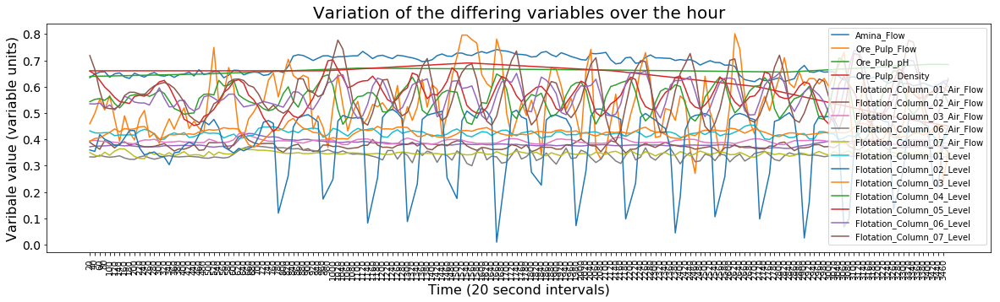

In [18]:
plt.figure(figsize=(20,5))
plt.plot(np.arange(20, 20*(len(df1.index)+1), 20),df1[diff_cols[1:]],label=diff_cols[1:])
plt.legend(diff_cols[1:], loc='best')
plt.title('Variation of the differing variables over the hour', fontsize = 20)
plt.xlabel('Time (20 second intervals)', fontsize = 16)
plt.ylabel('Varibale value (variable units)', fontsize = 16)
plt.xticks(np.arange(20, 20*len(df1.index), 20), fontsize = 10, rotation = 'vertical')
plt.yticks(fontsize = 14)

In [19]:
df1[diff_cols].head()

,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,Flotation_Column_06_Air_Flow,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level
0,0.479273,0.634233,0.459143,0.639033,0.660348,0.371565,0.388770,0.394444,0.333166,0.349737,0.432193,0.359466,0.392732,0.542995,0.659121,0.535024,0.718177
1,0.480047,0.647351,0.498537,0.639423,0.660348,0.374111,0.375311,0.395967,0.332679,0.339555,0.424473,0.353963,0.403231,0.551733,0.647538,0.534199,0.666028
2,0.483071,0.655564,0.552439,0.639812,0.660348,0.374222,0.362077,0.393044,0.339354,0.334583,0.423560,0.417646,0.405428,0.554825,0.624040,0.537706,0.584493
3,0.483690,0.656791,0.511653,0.640250,0.660348,0.375109,0.395004,0.391639,0.334254,0.351154,0.425244,0.400237,0.416282,0.548113,0.598483,0.519040,0.520727
4,0.481520,0.635705,0.566263,0.640639,0.660348,0.376551,0.383298,0.390820,0.331829,0.339200,0.425244,0.391719,0.426350,0.562510,0.581157,0.530074,0.516620


A closer look was made at one of the oscillating variables: Flotation_Column_02_Level and an attempt was made to determine the time period of oscillation using autocorrelation plots.

(array([-0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6]),
 <a list of 8 Text yticklabel objects>)

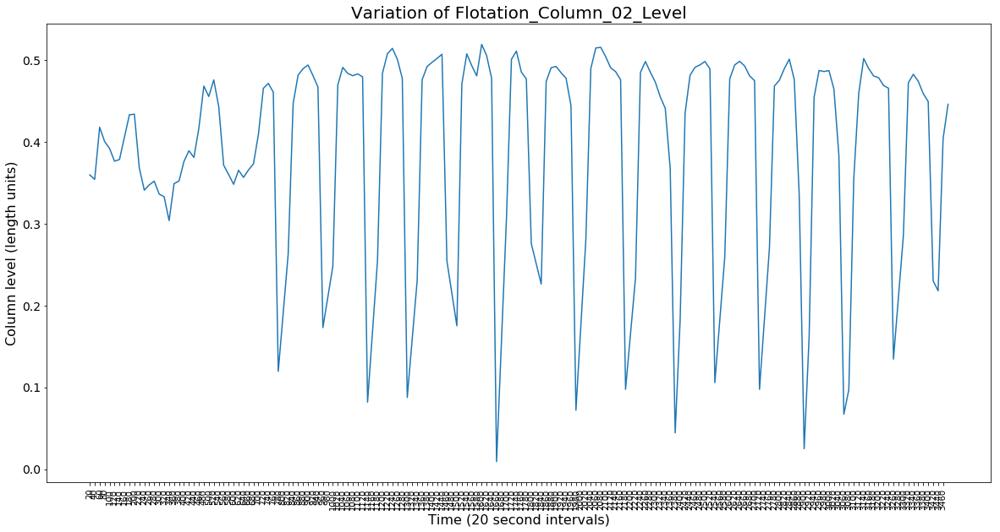

In [20]:
plt.figure(figsize=(20,10))
plt.plot(np.arange(20, 20*(len(df1.index)+1), 20), df1['Flotation_Column_02_Level'])
plt.title('Variation of Flotation_Column_02_Level', fontsize = 20)
plt.xlabel('Time (20 second intervals)', fontsize = 16)
plt.ylabel('Column level (length units)', fontsize = 16)
plt.xticks(np.arange(20, 20*len(df1.index), 20), fontsize = 10, rotation = 'vertical')
plt.yticks(fontsize = 14)

In [21]:
#corr1 = np.correlate(df1['Flotation_Column_02_Level'], df1['Flotation_Column_02_Level'], mode = 'same')

In [22]:
#plt.figure(figsize=(20,10))
#plt.plot(corr1)

In [23]:
var = np.array(df1['Flotation_Column_02_Level'])
x = var-np.mean(var)
corr1 = np.correlate(x, x, mode='same')

Text(0.5, 1.0, 'Auto-correlation plot')

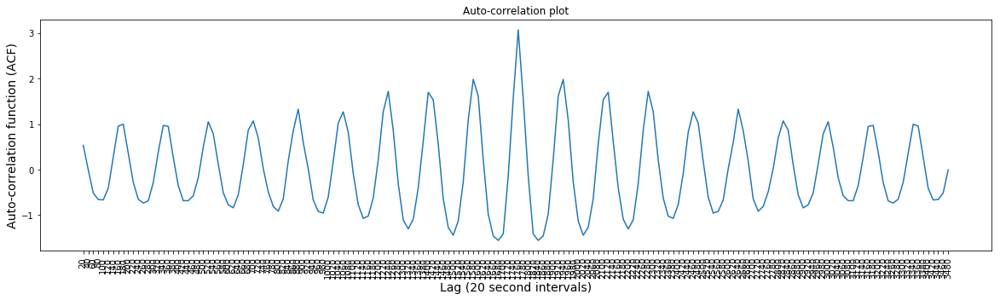

In [24]:
plt.figure(figsize=(20,5))
plt.plot(np.arange(20,20*(len(corr1)+1),20), corr1)
plt.xlabel('Lag (20 second intervals)', fontsize=14)
plt.ylabel('Auto-correlation function (ACF)', fontsize=14)
plt.xticks(np.arange(20,20*(len(corr1)+1),20), fontsize = 10, rotation = 'vertical')
plt.title('Auto-correlation plot')

In [25]:
len(corr1), len(var)

(174, 174)

In [26]:
corr1

array([ 0.531881  , -0.00533576, -0.51483765, -0.65932927, -0.66690439,
       -0.40896027,  0.27481959,  0.95629387,  0.99736835,  0.36144984,
       -0.2789181 , -0.65177854, -0.73622415, -0.68791456, -0.28458663,
        0.38353913,  0.97047218,  0.94924244,  0.27168443, -0.35287088,
       -0.68425183, -0.68391362, -0.57597877, -0.17951633,  0.49282436,
        1.05251844,  0.78664405,  0.12118871, -0.50904921, -0.77467188,
       -0.84207443, -0.55497517,  0.10518845,  0.8662396 ,  1.07075964,
        0.69825113,  0.02197807, -0.48822611, -0.81134615, -0.9155315 ,
       -0.64431809,  0.19079472,  0.85520278,  1.32883826,  0.59490081,
        0.01493017, -0.66883607, -0.92021989, -0.95751581, -0.60493205,
        0.18542603,  1.02362522,  1.27119731,  0.82084863, -0.08497645,
       -0.77016979, -1.07432955, -1.02304208, -0.62571179,  0.21600612,
        1.27227423,  1.72110258,  0.86360172, -0.30747067, -1.10705719,
       -1.30631773, -1.09190977, -0.40040906,  0.62334374,  1.70

It was observed that at the 9th lag timepoint (3 min lag) the correlation is high 0.997, indicating the period of oscillation around 3 min.

Besides these differing variables, 6 variables remain constatnt for the whole hour.

In [27]:
len(df.columns)-len(diff_cols) - 1

6

## Some preliminary inferences

From the preliminary analysis, following observations can be made:

1) Some variables retain a constant value throughout the hour. Therefore, it is essential to check if this phenomenon is reflected throughout the entire time span of sample collection.

2) The whole data set has a time-series nature. Therefore, it would be useful to look at seasonal effects using seasonal decomposition or t-tests. Model-building must also be done keeping on mind the time-series nature of data.

3) Models like random forests and ARIMA can be used and compared for predicting the output - percentage of silica in the concentrate.

## EDA and pre-processing continued

Generting a list of columns not differing within the hour for the first timestamp.

In [28]:
not_diff_cols = list(df.columns)
for col in not_diff_cols:
    if col in diff_cols:
        not_diff_cols.remove(col)

In [29]:
not_diff_cols

['date',
 '%_Iron_Feed',
 '%_Silica_Feed',
 'Amina_Flow',
 'Ore_Pulp_pH',
 'Flotation_Column_01_Air_Flow',
 'Flotation_Column_03_Air_Flow',
 'Flotation_Column_04_Air_Flow',
 'Flotation_Column_05_Air_Flow',
 'Flotation_Column_07_Air_Flow',
 'Flotation_Column_02_Level',
 'Flotation_Column_04_Level',
 'Flotation_Column_06_Level',
 '%_Iron_Concentrate',
 '%_Silica_Concentrate']

In [30]:
len(diff_cols), len(not_diff_cols), len(df.columns)

(17, 15, 24)

Since the differing columns may be required in future for all the different timestamps, a function was created for this purpose that outputs the list of columns having value_counts() greater than 1.

In [31]:
def get_diff_cols(df):
    diff_cols = []
    for col in df.columns:
        if len(df[col].value_counts()) > 1:
            diff_cols.append(col)
    return diff_cols

A list containing the number of differeing columns for each unique timestamp was created.

In [32]:
num_diff_cols = []

for date in unique_time:
    df2 = df[df['date'] == date]
    diff_cols = get_diff_cols(df2)
    num_diff_cols.append(len(diff_cols))
    #print(len(diff_cols))

A plot showing the number of differing columns was created to get an idea about the entire dataset regarding the number of differeing variables.

Text(0.5, 1.0, 'Plot showing number of columns differing within the hour')

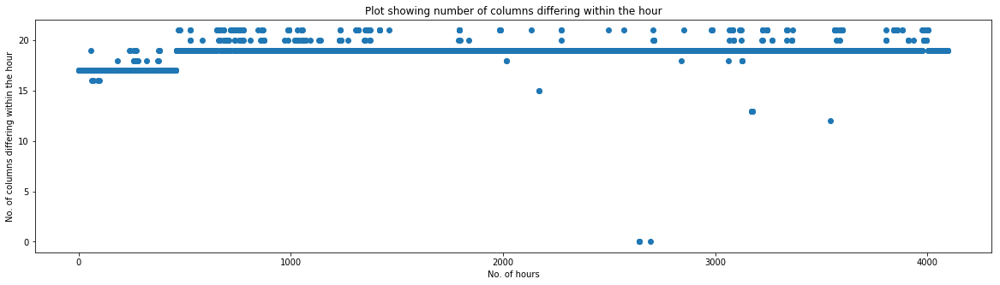

In [36]:
plt.figure(figsize=(20,5))
plt.scatter(np.arange(len(num_diff_cols)), num_diff_cols)
plt.xlabel('No. of hours')
plt.ylabel('No. of columns differing within the hour')
plt.title('Plot showing number of columns differing within the hour')

A function that outputs the different column labels between two input columns was defined for further use.

In [37]:
def get_diff_col_labels(col_list_a, col_list_b):
    if len(col_list_a) >= len(col_list_b):
        small = col_list_b
        large = col_list_a
    else:
        small = col_list_a
        large = col_list_b
    
    diff_col_labels = []
    for col_label in large:
        if col_label not in small:
            diff_col_labels.append(col_label)
    return diff_col_labels

In [38]:
df3 = df[df['date'] == unique_time[459]]
df4 = df[df['date'] == unique_time[460]]
get_diff_col_labels(get_diff_cols(df3), get_diff_cols(df4))

['Flotation_Column_04_Air_Flow', 'Flotation_Column_05_Air_Flow']

In [39]:
df3 = df[df['date'] == unique_time[58]]
df4 = df[df['date'] == unique_time[59]]
get_diff_col_labels(get_diff_cols(df3), get_diff_cols(df4))

['%_Iron_Concentrate', '%_Silica_Concentrate']

In [40]:
print(len(df.columns))
not_diff_cols = list(df.columns)
for col in list(df.columns):
    #print(col)
    if col in diff_cols:
        #print(col)
        not_diff_cols.remove(col)
        #print(len(not_diff_cols))

24


In [41]:
not_diff_cols

['date',
 '%_Iron_Feed',
 '%_Silica_Feed',
 '%_Iron_Concentrate',
 '%_Silica_Concentrate']

Only 3 columns are such that their values remain constant throughout the hour for the entire dataset duration (practically, only 2 such variables i.e. % Iron feed and % silica feed)

This brings us to another observation that % silica in the concentrate actually changes within the hour implying some dependence on the changing-within-the-hour variables.

In [42]:
diff_cols

['Starch_Flow',
 'Amina_Flow',
 'Ore_Pulp_Flow',
 'Ore_Pulp_pH',
 'Ore_Pulp_Density',
 'Flotation_Column_01_Air_Flow',
 'Flotation_Column_02_Air_Flow',
 'Flotation_Column_03_Air_Flow',
 'Flotation_Column_04_Air_Flow',
 'Flotation_Column_05_Air_Flow',
 'Flotation_Column_06_Air_Flow',
 'Flotation_Column_07_Air_Flow',
 'Flotation_Column_01_Level',
 'Flotation_Column_02_Level',
 'Flotation_Column_03_Level',
 'Flotation_Column_04_Level',
 'Flotation_Column_05_Level',
 'Flotation_Column_06_Level',
 'Flotation_Column_07_Level']

In [43]:
df1.head()

,date,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
0,2017-03-10 01:00:00,0.540799,0.488314,0.479273,0.634233,0.459143,0.639033,0.660348,0.371565,0.388770,...,0.349737,0.432193,0.359466,0.392732,0.542995,0.659121,0.535024,0.718177,0.815436,0.144016
1,2017-03-10 01:00:00,0.540799,0.488314,0.480047,0.647351,0.498537,0.639423,0.660348,0.374111,0.375311,...,0.339555,0.424473,0.353963,0.403231,0.551733,0.647538,0.534199,0.666028,0.815436,0.144016
2,2017-03-10 01:00:00,0.540799,0.488314,0.483071,0.655564,0.552439,0.639812,0.660348,0.374222,0.362077,...,0.334583,0.423560,0.417646,0.405428,0.554825,0.624040,0.537706,0.584493,0.815436,0.144016
3,2017-03-10 01:00:00,0.540799,0.488314,0.483690,0.656791,0.511653,0.640250,0.660348,0.375109,0.395004,...,0.351154,0.425244,0.400237,0.416282,0.548113,0.598483,0.519040,0.520727,0.815436,0.144016
4,2017-03-10 01:00:00,0.540799,0.488314,0.481520,0.635705,0.566263,0.640639,0.660348,0.376551,0.383298,...,0.339200,0.425244,0.391719,0.426350,0.562510,0.581157,0.530074,0.516620,0.815436,0.144016


Observing oscillatory vs. non-oscillatory variables.

In [44]:
'''
for col in diff_cols:
    x = df[col]
    plt.figure(figsize = (20,5))
    corr = np.correlate(x, x, mode = 'same')
    plt.plot(np.arange(20,20*(len(corr)+1),20), corr)
    plt.xlabel('Lag (20 second intervals)', fontsize=14)
    plt.ylabel('Auto-correlation function (ACF)', fontsize=14)
    plt.xticks(np.arange(20,20*(len(corr)+1),20), fontsize = 10, rotation = 'vertical')
    plt.title('Auto-correlation plot for ' + col + ' column')
    print('plot done!')
'''

"\nfor col in diff_cols:\n    x = df[col]\n    plt.figure(figsize = (20,5))\n    corr = np.correlate(x, x, mode = 'same')\n    plt.plot(np.arange(20,20*(len(corr)+1),20), corr)\n    plt.xlabel('Lag (20 second intervals)', fontsize=14)\n    plt.ylabel('Auto-correlation function (ACF)', fontsize=14)\n    plt.xticks(np.arange(20,20*(len(corr)+1),20), fontsize = 10, rotation = 'vertical')\n    plt.title('Auto-correlation plot for ' + col + ' column')\n    print('plot done!')\n"

Getting auto-correlation plots for each variable involved very high runtime. Therefore the script was broken down and checked for the time-consuming step. It turns out that np.correlate() is taking lot of time to execute.

This was bypassed by the use of seasonal_decompose function in statsmodels for figuring out periodic/seasonal trends in the dataset (as pointed out in the pre-liminary inferences).

In [45]:
col = diff_cols[0]
x = df[col]

In [46]:
#corr = np.correlate(x, x, mode = 'same')

In [47]:
'''
plt.figure(figsize = (20,5))
plt.plot(np.arange(20,20*(len(corr)+1),20), corr)
plt.xlabel('Lag (20 second intervals)', fontsize=14)
plt.ylabel('Auto-correlation function (ACF)', fontsize=14)
plt.xticks(np.arange(20,20*(len(corr)+1),20), fontsize = 10, rotation = 'vertical')
plt.title('Auto-correlation plot for ' + col + ' column')
print('plot done!')
'''

"\nplt.figure(figsize = (20,5))\nplt.plot(np.arange(20,20*(len(corr)+1),20), corr)\nplt.xlabel('Lag (20 second intervals)', fontsize=14)\nplt.ylabel('Auto-correlation function (ACF)', fontsize=14)\nplt.xticks(np.arange(20,20*(len(corr)+1),20), fontsize = 10, rotation = 'vertical')\nplt.title('Auto-correlation plot for ' + col + ' column')\nprint('plot done!')\n"

A test series was created for the seasonal decompose function containing the timestamps as index.

In [48]:
test_series = df[['date', diff_cols[0]]]

In [49]:
test_series.set_index('date')

,Starch_Flow
date,
2017-03-10 01:00:00,0.479273
2017-03-10 01:00:00,0.480047
2017-03-10 01:00:00,0.483071
2017-03-10 01:00:00,0.483690
2017-03-10 01:00:00,0.481520
2017-03-10 01:00:00,0.488728
2017-03-10 01:00:00,0.496456
2017-03-10 01:00:00,0.500447
2017-03-10 01:00:00,0.499548


In [50]:
#test_decomp = seasonal_decompose(test_series)

For simplicity in determination of inferred frequency an attempt was made to alter the timestamps from hourly to second-level intervals.

The inspiration for this came from the fact that, except for 2 timestamps, all the others contained precisely 180 readings for each hour making the reading interval as 20 seconds. Therefore a new timestamp series was created containing timestamps at 20 second intervals. For the 2 exception columns containing 174 and 179 readings, following steps were taken.

1) The first timestamp itself is the one containing 174 readings therefore, to keep the time series as continuous as possible the clock actually begins 2 minutes (6 X 20 sec) after 2017-03-10 01:00:00.

2) The timestamp missing only 1 reading (i.e. containing 179 readings) was dealt by removing the last timestamp from that particular hour (creating a 40 sec gap till the next hour readings).

In [51]:
df.date.value_counts()

2017-05-13 19:00:00    180
2017-06-10 21:00:00    180
2017-07-28 11:00:00    180
2017-07-18 15:00:00    180
2017-06-10 08:00:00    180
2017-04-25 16:00:00    180
2017-06-24 22:00:00    180
2017-06-04 13:00:00    180
2017-08-03 19:00:00    180
2017-03-15 01:00:00    180
2017-06-19 03:00:00    180
2017-05-11 20:00:00    180
2017-05-02 00:00:00    180
2017-03-15 18:00:00    180
2017-08-06 02:00:00    180
2017-04-26 05:00:00    180
2017-06-18 14:00:00    180
2017-06-25 11:00:00    180
2017-05-18 04:00:00    180
2017-08-22 06:00:00    180
2017-04-02 12:00:00    180
2017-08-12 10:00:00    180
2017-05-12 09:00:00    180
2017-05-02 13:00:00    180
2017-08-06 15:00:00    180
2017-06-29 08:00:00    180
2017-08-28 14:00:00    180
2017-04-08 20:00:00    180
2017-07-13 22:00:00    180
2017-05-18 17:00:00    180
                      ... 
2017-07-21 05:00:00    180
2017-05-11 08:00:00    180
2017-06-28 09:00:00    180
2017-07-30 02:00:00    180
2017-04-26 14:00:00    180
2017-07-01 13:00:00    180
2

In [52]:
df[df['date'] == '2017-03-10 01:00:00']

,date,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
0,2017-03-10 01:00:00,0.540799,0.488314,0.479273,0.634233,0.459143,0.639033,0.660348,0.371565,0.388770,...,0.349737,0.432193,0.359466,0.392732,0.542995,0.659121,0.535024,0.718177,0.815436,0.144016
1,2017-03-10 01:00:00,0.540799,0.488314,0.480047,0.647351,0.498537,0.639423,0.660348,0.374111,0.375311,...,0.339555,0.424473,0.353963,0.403231,0.551733,0.647538,0.534199,0.666028,0.815436,0.144016
2,2017-03-10 01:00:00,0.540799,0.488314,0.483071,0.655564,0.552439,0.639812,0.660348,0.374222,0.362077,...,0.334583,0.423560,0.417646,0.405428,0.554825,0.624040,0.537706,0.584493,0.815436,0.144016
3,2017-03-10 01:00:00,0.540799,0.488314,0.483690,0.656791,0.511653,0.640250,0.660348,0.375109,0.395004,...,0.351154,0.425244,0.400237,0.416282,0.548113,0.598483,0.519040,0.520727,0.815436,0.144016
4,2017-03-10 01:00:00,0.540799,0.488314,0.481520,0.635705,0.566263,0.640639,0.660348,0.376551,0.383298,...,0.339200,0.425244,0.391719,0.426350,0.562510,0.581157,0.530074,0.516620,0.815436,0.144016
5,2017-03-10 01:00:00,0.540799,0.488314,0.488728,0.648821,0.478487,0.641029,0.660348,0.379208,0.367215,...,0.355065,0.413945,0.376139,0.439401,0.535974,0.559511,0.511396,0.516164,0.815436,0.144016
6,2017-03-10 01:00:00,0.540799,0.488314,0.496456,0.652376,0.392786,0.641418,0.660348,0.377105,0.383626,...,0.363705,0.416471,0.378246,0.428695,0.519392,0.543705,0.531719,0.528120,0.815436,0.144016
7,2017-03-10 01:00:00,0.540799,0.488314,0.500447,0.636931,0.489550,0.641856,0.660348,0.374998,0.390737,...,0.362994,0.416190,0.405374,0.440967,0.540117,0.540131,0.563384,0.566151,0.815436,0.144016
8,2017-03-10 01:00:00,0.540799,0.488314,0.499548,0.631413,0.425977,0.642245,0.660348,0.376218,0.378159,...,0.349737,0.417173,0.432946,0.437631,0.565219,0.536332,0.555959,0.579020,0.815436,0.144016
9,2017-03-10 01:00:00,0.540799,0.488314,0.498804,0.651151,0.397622,0.642635,0.660348,0.373778,0.383626,...,0.334939,0.415770,0.433583,0.439685,0.569371,0.562751,0.541521,0.578680,0.815436,0.144016


In [53]:
df[df['date'] == '2017-04-10 00:00:00']

,date,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
76494,2017-04-10,0.592448,0.380804,0.330507,0.301413,0.648448,0.461042,0.688090,0.378093,0.378453,...,0.341904,0.640630,0.623893,0.629164,0.531689,0.517762,0.512097,0.552441,0.637584,0.162272
76495,2017-04-10,0.592448,0.380804,0.329286,0.303162,0.643518,0.461377,0.689650,0.377302,0.390548,...,0.340218,0.622362,0.627486,0.638015,0.546204,0.527413,0.537837,0.521994,0.637584,0.162272
76496,2017-04-10,0.592448,0.380804,0.329170,0.302238,0.593178,0.461713,0.691240,0.377357,0.387530,...,0.340342,0.613711,0.630781,0.640272,0.553594,0.535581,0.562650,0.523749,0.637584,0.162272
76497,2017-04-10,0.592448,0.380804,0.330456,0.298283,0.491248,0.462054,0.692799,0.378381,0.367364,...,0.342524,0.615974,0.633737,0.635041,0.552899,0.542069,0.586415,0.562054,0.637584,0.162272
76498,2017-04-10,0.592448,0.380804,0.331283,0.298068,0.424066,0.462390,0.694359,0.378865,0.359154,...,0.343806,0.619908,0.634663,0.629446,0.554929,0.549559,0.599645,0.596065,0.637584,0.162272
76499,2017-04-10,0.592448,0.380804,0.330850,0.306649,0.438597,0.462726,0.695918,0.378088,0.379061,...,0.342976,0.627767,0.630815,0.622992,0.563371,0.559411,0.588096,0.619971,0.637584,0.162272
76500,2017-04-10,0.592448,0.380804,0.329946,0.305661,0.425623,0.463066,0.697478,0.377988,0.385185,...,0.341856,0.633922,0.633463,0.618947,0.557994,0.561395,0.583262,0.617220,0.637584,0.162272
76501,2017-04-10,0.592448,0.380804,0.328950,0.303236,0.408544,0.463402,0.699037,0.377988,0.389238,...,0.340681,0.639819,0.637087,0.615266,0.550541,0.562199,0.579439,0.610466,0.637584,0.162272
76502,2017-04-10,0.592448,0.380804,0.327953,0.300814,0.391465,0.463738,0.700597,0.377988,0.393296,...,0.339512,0.645718,0.640710,0.611583,0.543087,0.563001,0.575616,0.603711,0.637584,0.162272
76503,2017-04-10,0.592448,0.380804,0.326956,0.298390,0.374387,0.464079,0.702156,0.377988,0.397354,...,0.338343,0.651616,0.644334,0.607902,0.535634,0.563805,0.571791,0.596956,0.637584,0.162272


In [54]:
dates = list(df['date'])

The time-alteration process was first tested in an individual test time-point.

In [55]:
test_date = dates[1]

In [56]:
test_date + timedelta(seconds=20)

Timestamp('2017-03-10 01:00:20')

In [57]:
dates

[Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-

The testing was scaled-up to the level of a sample one hour readings.

In [58]:
delta_t = 0
new_dates = []
for time in dates:
    new_dates.append(time + timedelta(seconds=delta_t))
    delta_t+=20

In [59]:
new_dates

[Timestamp('2017-03-10 01:00:00'),
 Timestamp('2017-03-10 01:00:20'),
 Timestamp('2017-03-10 01:00:40'),
 Timestamp('2017-03-10 01:01:00'),
 Timestamp('2017-03-10 01:01:20'),
 Timestamp('2017-03-10 01:01:40'),
 Timestamp('2017-03-10 01:02:00'),
 Timestamp('2017-03-10 01:02:20'),
 Timestamp('2017-03-10 01:02:40'),
 Timestamp('2017-03-10 01:03:00'),
 Timestamp('2017-03-10 01:03:20'),
 Timestamp('2017-03-10 01:03:40'),
 Timestamp('2017-03-10 01:04:00'),
 Timestamp('2017-03-10 01:04:20'),
 Timestamp('2017-03-10 01:04:40'),
 Timestamp('2017-03-10 01:05:00'),
 Timestamp('2017-03-10 01:05:20'),
 Timestamp('2017-03-10 01:05:40'),
 Timestamp('2017-03-10 01:06:00'),
 Timestamp('2017-03-10 01:06:20'),
 Timestamp('2017-03-10 01:06:40'),
 Timestamp('2017-03-10 01:07:00'),
 Timestamp('2017-03-10 01:07:20'),
 Timestamp('2017-03-10 01:07:40'),
 Timestamp('2017-03-10 01:08:00'),
 Timestamp('2017-03-10 01:08:20'),
 Timestamp('2017-03-10 01:08:40'),
 Timestamp('2017-03-10 01:09:00'),
 Timestamp('2017-03-

Once confident in the correctness of the procedure, a grand_time_list containing the final timestamps was created which would eventually replace the existing timestamps.

In [60]:
grand_time_list = []
for time in unique_time:
    time_list = []
    for delta_t in range(0,3600,20):
        time_list.append(time + timedelta(seconds=delta_t))
    df_temp = df[df['date'] == time]
    slice_len = len(df_temp)
    if slice_len < 178:
        time_list = time_list[180-slice_len:]
    else:
        time_list = time_list[:slice_len]
    grand_time_list+=time_list

A couple of manual checks for correctness were performed between the original and the new timelist.

In [61]:
len(grand_time_list),len(df)

(737453, 737453)

In [62]:
grand_time_list[174], df.date[174]

(Timestamp('2017-03-10 02:00:00'), Timestamp('2017-03-10 02:00:00'))

In [63]:
grand_time_list[355], df.date[355]

(Timestamp('2017-03-10 03:00:20'), Timestamp('2017-03-10 03:00:00'))

Finally, the 'date' column was replaced by the new timelist

In [64]:
df['date'] = grand_time_list

In [65]:
df

,date,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
0,2017-03-10 01:02:00,0.540799,0.488314,0.479273,0.634233,0.459143,0.639033,0.660348,0.371565,0.388770,...,0.349737,0.432193,0.359466,0.392732,0.542995,0.659121,0.535024,0.718177,0.815436,0.144016
1,2017-03-10 01:02:20,0.540799,0.488314,0.480047,0.647351,0.498537,0.639423,0.660348,0.374111,0.375311,...,0.339555,0.424473,0.353963,0.403231,0.551733,0.647538,0.534199,0.666028,0.815436,0.144016
2,2017-03-10 01:02:40,0.540799,0.488314,0.483071,0.655564,0.552439,0.639812,0.660348,0.374222,0.362077,...,0.334583,0.423560,0.417646,0.405428,0.554825,0.624040,0.537706,0.584493,0.815436,0.144016
3,2017-03-10 01:03:00,0.540799,0.488314,0.483690,0.656791,0.511653,0.640250,0.660348,0.375109,0.395004,...,0.351154,0.425244,0.400237,0.416282,0.548113,0.598483,0.519040,0.520727,0.815436,0.144016
4,2017-03-10 01:03:20,0.540799,0.488314,0.481520,0.635705,0.566263,0.640639,0.660348,0.376551,0.383298,...,0.339200,0.425244,0.391719,0.426350,0.562510,0.581157,0.530074,0.516620,0.815436,0.144016
5,2017-03-10 01:03:40,0.540799,0.488314,0.488728,0.648821,0.478487,0.641029,0.660348,0.379208,0.367215,...,0.355065,0.413945,0.376139,0.439401,0.535974,0.559511,0.511396,0.516164,0.815436,0.144016
6,2017-03-10 01:04:00,0.540799,0.488314,0.496456,0.652376,0.392786,0.641418,0.660348,0.377105,0.383626,...,0.363705,0.416471,0.378246,0.428695,0.519392,0.543705,0.531719,0.528120,0.815436,0.144016
7,2017-03-10 01:04:20,0.540799,0.488314,0.500447,0.636931,0.489550,0.641856,0.660348,0.374998,0.390737,...,0.362994,0.416190,0.405374,0.440967,0.540117,0.540131,0.563384,0.566151,0.815436,0.144016
8,2017-03-10 01:04:40,0.540799,0.488314,0.499548,0.631413,0.425977,0.642245,0.660348,0.376218,0.378159,...,0.349737,0.417173,0.432946,0.437631,0.565219,0.536332,0.555959,0.579020,0.815436,0.144016
9,2017-03-10 01:05:00,0.540799,0.488314,0.498804,0.651151,0.397622,0.642635,0.660348,0.373778,0.383626,...,0.334939,0.415770,0.433583,0.439685,0.569371,0.562751,0.541521,0.578680,0.815436,0.144016


Now that we have a timeseries containing almost equally spaced timestamps, another attempt was made at seasonal decomposition. However, the decomposition resulted in a residual (random noise) having higher average magnitude than the seasonal component. Therefore, that part of analysis has been shifted to the Appendix.

In [66]:
new_index = pd.DatetimeIndex(grand_time_list)

In [67]:
df['date'] = new_index

In [68]:
df = df.set_index('date')

In [69]:
df.index.dtype

dtype('<M8[ns]')

In [70]:
df.index = pd.to_datetime(df.index, yearfirst=True, infer_datetime_format=True)

In [71]:
test_series = df['Flotation_Column_02_Level']

In [72]:
print(pd.infer_freq(df.index, warn=True))

None


In [78]:
df[(df.index > '2017-03-16 05:59:40') & (df.index < '2017-03-30')]

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-03-29 12:00:00,0.756944,0.250234,0.324590,0.217411,0.692961,0.483122,0.389376,0.125443,0.102462,0.134966,...,0.350373,0.569445,0.552445,0.642586,0.513799,0.484949,0.537818,0.597499,0.736577,0.154158
2017-03-29 12:00:20,0.756944,0.250234,0.320710,0.223744,0.664111,0.481005,0.370840,0.124122,0.106156,0.130085,...,0.349435,0.573057,0.556127,0.701191,0.519041,0.501947,0.531260,0.594104,0.736577,0.154158
2017-03-29 12:00:40,0.756944,0.250234,0.319487,0.230077,0.635285,0.478883,0.352304,0.122801,0.109856,0.125204,...,0.348492,0.576669,0.559808,0.759795,0.524284,0.518945,0.524703,0.590709,0.736577,0.154158
2017-03-29 12:01:00,0.756944,0.250234,0.318666,0.236412,0.606435,0.476766,0.333768,0.121481,0.113550,0.120323,...,0.347550,0.580281,0.563489,0.818400,0.529528,0.535943,0.518145,0.587317,0.736577,0.154158
2017-03-29 12:01:20,0.756944,0.250234,0.318071,0.242745,0.577609,0.474644,0.315232,0.120160,0.117245,0.115443,...,0.346612,0.583893,0.567170,0.877004,0.534769,0.552941,0.511587,0.583922,0.736577,0.154158
2017-03-29 12:01:40,0.756944,0.250234,0.317475,0.249839,0.544961,0.472527,0.296696,0.121324,0.107132,0.124550,...,0.342847,0.587505,0.570851,0.935609,0.531997,0.592803,0.527618,0.576853,0.736577,0.154158
2017-03-29 12:02:00,0.756944,0.250234,0.316882,0.257124,0.511346,0.470405,0.278160,0.123119,0.093539,0.137191,...,0.338370,0.591117,0.574532,0.994214,0.529225,0.638433,0.549350,0.568854,0.736577,0.154158
2017-03-29 12:02:20,0.756944,0.250234,0.318302,0.246581,0.606954,0.468288,0.259624,0.123245,0.087405,0.141204,...,0.336997,0.594729,0.578214,0.992465,0.526453,0.624833,0.517622,0.578925,0.736577,0.154158
2017-03-29 12:02:40,0.756944,0.250234,0.318206,0.253617,0.646608,0.466166,0.241088,0.125151,0.090542,0.131139,...,0.339712,0.598340,0.581895,0.992872,0.554142,0.640991,0.526500,0.594610,0.736577,0.154158


In [79]:
df[(df.index >= '2017-03-30') & (df.index < '2017-03-31')]

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-03-30 00:00:00,0.729167,0.257089,0.302865,0.586245,0.584922,0.413620,0.614882,0.121234,0.099972,0.132305,...,0.349107,0.989981,0.987307,0.989120,0.573866,0.835674,0.727725,0.716213,0.723154,0.221095
2017-03-30 00:00:20,0.729167,0.257089,0.300727,0.587008,0.567937,0.413732,0.615512,0.121249,0.098299,0.135120,...,0.349053,0.989980,0.987336,0.989271,0.538425,0.836456,0.743584,0.696475,0.723154,0.221095
2017-03-30 00:00:40,0.729167,0.257089,0.300930,0.585158,0.531751,0.413844,0.616141,0.123144,0.107192,0.130841,...,0.359137,0.989979,0.987366,0.989421,0.561522,0.832261,0.722949,0.673730,0.723154,0.221095
2017-03-30 00:01:00,0.729167,0.257089,0.297860,0.587815,0.487380,0.413956,0.616771,0.122549,0.108362,0.121457,...,0.347103,0.989977,0.987396,0.989572,0.580321,0.821696,0.741400,0.678052,0.723154,0.221095
2017-03-30 00:01:20,0.729167,0.257089,0.295099,0.588653,0.460393,0.414068,0.617401,0.122433,0.107954,0.117550,...,0.340913,0.989976,0.987426,0.989722,0.607151,0.814237,0.745772,0.685343,0.723154,0.221095
2017-03-30 00:01:40,0.729167,0.257089,0.293492,0.584417,0.484266,0.414180,0.618031,0.123709,0.102910,0.129675,...,0.351822,0.989975,0.987455,0.989872,0.659253,0.814860,0.710725,0.701740,0.723154,0.221095
2017-03-30 00:02:00,0.729167,0.257089,0.291892,0.579094,0.521679,0.414326,0.618661,0.123139,0.077631,0.137393,...,0.350098,0.989974,0.987485,0.990023,0.758639,0.843581,0.712081,0.713292,0.723154,0.221095
2017-03-30 00:02:20,0.729167,0.257089,0.291188,0.578970,0.534157,0.414496,0.618571,0.122106,0.062310,0.138500,...,0.343790,0.989972,0.987515,0.990173,0.838540,0.869782,0.727887,0.718869,0.723154,0.221095
2017-03-30 00:02:40,0.729167,0.257089,0.292397,0.600300,0.464026,0.414671,0.617851,0.121869,0.098772,0.133710,...,0.342389,0.989971,0.987545,0.990324,0.971491,0.879309,0.727887,0.741242,0.723154,0.221095


In [80]:
df[(df.index == unique_time[34])]

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-03-11 11:00:00,0.744358,0.239015,0.389789,0.632885,0.704473,0.3382,0.720331,0.387516,0.377283,0.400996,...,0.351865,0.558604,0.071937,0.526806,0.723384,0.757552,0.743566,0.823957,0.741611,0.200811


In [81]:
for time in df.index:
    print(time.date())

2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10

2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10

2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10

2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10

2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10
2017-03-10

2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11

2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11

2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11

2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11
2017-03-11

2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12

2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12

2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12

2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12
2017-03-12

2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13

2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13

2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13

2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13

2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13
2017-03-13

2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14

2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14

2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14

2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14
2017-03-14

2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15

2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15

2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15

2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15
2017-03-15

2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16
2017-03-16

2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29

2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29

2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-29
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30

2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30

2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30

2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30

2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30
2017-03-30

2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31

2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31

2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31

2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31
2017-03-31

2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01

2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01

2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01

2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01

2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-01
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02

2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02

2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02

2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02

2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02
2017-04-02

2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03

2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03

2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03

2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03
2017-04-03

2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04

2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04

2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04

2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04
2017-04-04

2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05

2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05

2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05

2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05

2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05
2017-04-05

2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06

2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06

2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06

2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06
2017-04-06

2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07

2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07

2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07

2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07
2017-04-07

2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08

2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08

2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08

2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08

2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08
2017-04-08

2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09

2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09

2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09

2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09
2017-04-09

2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10

2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10

2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10

2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10
2017-04-10

2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11

2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11

2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11

2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11

2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11
2017-04-11

2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12

2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12

2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12

2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12
2017-04-12

2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13

2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13

2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13

2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13
2017-04-13

2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14

2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14

2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14

2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14

2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14
2017-04-14

2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15

2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15

2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15

2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-15
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16

2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16

2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16

2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16

2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16
2017-04-16

2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17

2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17

2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17

2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17
2017-04-17

2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18

2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18

2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18

2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18
2017-04-18

2017-04-18
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19

2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19

2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19

2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19

2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19
2017-04-19

2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20

2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20

2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20

2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20
2017-04-20

2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21

2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21

2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21

2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21
2017-04-21

2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22

2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22

2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22

2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22

2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22
2017-04-22

2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23

2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23

2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23

2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23
2017-04-23

2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24

2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24

2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24

2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24
2017-04-24

2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25

2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25

2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25

2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25

2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25
2017-04-25

2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26

2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26

2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26

2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26
2017-04-26

2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27

2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27

2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27

2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27
2017-04-27

2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28

2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28

2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28

2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28

2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28
2017-04-28

2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29

2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29

2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29

2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29
2017-04-29

2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30

2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30

2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30

2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30
2017-04-30

2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01

2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01

2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01

2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01

2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01
2017-05-01

2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02

2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02

2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02

2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02
2017-05-02

2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03

2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03

2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03

2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03
2017-05-03

2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04

2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04

2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04

2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04

2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04
2017-05-04

2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05

2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05

2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05

2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05
2017-05-05

2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06

2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06

2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06

2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06
2017-05-06

2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07

2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07

2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07

2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07

2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07
2017-05-07

2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08

2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08

2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08

2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08
2017-05-08

2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09

2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09

2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09

2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09
2017-05-09

2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10

2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10

2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10

2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10
2017-05-10

2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11

2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11

2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11

2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11
2017-05-11

2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12

2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12

2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12

2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12

2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12
2017-05-12

2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13

2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13

2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13

2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13
2017-05-13

2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14

2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14

2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14

2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14
2017-05-14

2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15

2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15

2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15
2017-05-15

2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16

2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16

2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16

2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16
2017-05-16

2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17

2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17

2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17

2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17
2017-05-17

2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18

2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18

2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18

2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18
2017-05-18

2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19

2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19

2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19

2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19
2017-05-19

2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20

2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20

2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20

2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20
2017-05-20

2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21

2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21

2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21
2017-05-21

2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22

2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22

2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22

2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22
2017-05-22

2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23

2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23

2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23

2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23
2017-05-23

2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24

2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24

2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24

2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24

2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24
2017-05-24

2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25

2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25

2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25
2017-05-25

2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26

2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26

2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26

2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26
2017-05-26

2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27

2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27

2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27

2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-27
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28

2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28

2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28

2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28

2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28
2017-05-28

2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29

2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29

2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29

2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29
2017-05-29

2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30

2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30

2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30
2017-05-30

2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31

2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31

2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31

2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31
2017-05-31

2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01

2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01

2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01

2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01
2017-06-01

2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02

2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02

2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02
2017-06-02

2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03

2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03

2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03

2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03
2017-06-03

2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04

2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04

2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04

2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04
2017-06-04

2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05

2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05

2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05
2017-06-05

2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06

2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06

2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06

2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06
2017-06-06

2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07

2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07

2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07

2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07
2017-06-07

2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08

2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08

2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08
2017-06-08

2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09

2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09

2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09

2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09
2017-06-09

2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10

2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10

2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10

2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10
2017-06-10

2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11

2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11

2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11

2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11
2017-06-11

2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12

2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12

2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12

2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12

2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12
2017-06-12

2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13

2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13

2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13

2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-13
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14

2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14

2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14

2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14
2017-06-14

2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15

2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15

2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15

2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15
2017-06-15

2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16

2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16

2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16
2017-06-16

2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17

2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17

2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17

2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17
2017-06-17

2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18

2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18

2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18
2017-06-18

2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19

2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19

2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19

2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19
2017-06-19

2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20

2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20

2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20
2017-06-20

2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21

2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21

2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21

2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21
2017-06-21

2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22

2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22
2017-06-22

2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23

2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23

2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23

2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23
2017-06-23

2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24

2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24

2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24

2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24

2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-24
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25

2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25

2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25

2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25
2017-06-25

2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26

2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26

2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26
2017-06-26

2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27

2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27

2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27

2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27
2017-06-27

2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28

2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28

2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28
2017-06-28

2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29

2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29

2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29

2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29
2017-06-29

2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30

2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30

2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30

2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30
2017-06-30

2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01

2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01

2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01
2017-07-01

2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02

2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02

2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02

2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02
2017-07-02

2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03

2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03

2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03
2017-07-03

2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04

2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04

2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04

2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04
2017-07-04

2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05

2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05

2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05
2017-07-05

2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06

2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06

2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06
2017-07-06

2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07

2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07

2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07
2017-07-07

2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08

2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08

2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08
2017-07-08

2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09

2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09

2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09

2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09
2017-07-09

2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10

2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10

2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10

2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10
2017-07-10

2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11

2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11

2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-11
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12

2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12

2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12

2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12
2017-07-12

2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13

2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13

2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13
2017-07-13

2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14

2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14

2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14

2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-14
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15

2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15

2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15

2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15
2017-07-15

2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16

2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16

2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16
2017-07-16

2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17

2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17

2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17
2017-07-17

2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18

2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18

2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18

2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18
2017-07-18

2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19

2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19

2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19
2017-07-19

2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20

2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20

2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20
2017-07-20

2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21

2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21

2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21
2017-07-21

2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22

2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22

2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22
2017-07-22

2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23

2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23

2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23
2017-07-23

2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24

2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24

2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24

2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24
2017-07-24

2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25

2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25

2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25

2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-25
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26

2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26

2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26
2017-07-26

2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27

2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27

2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27

2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27
2017-07-27

2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28

2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28

2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-28
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29

2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29

2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29
2017-07-29

2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30

2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30

2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30
2017-07-30

2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31

2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31

2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31
2017-07-31

2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01

2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01

2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01
2017-08-01

2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02

2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02

2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02
2017-08-02

2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03

2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03

2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03
2017-08-03

2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04

2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04

2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04
2017-08-04

2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05

2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05

2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-05
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06

2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06

2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06

2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06
2017-08-06

2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07

2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07

2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07
2017-08-07

2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08

2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08

2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08

2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-08
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09

2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09

2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09

2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09
2017-08-09

2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10

2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10

2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10
2017-08-10

2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11

2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11

2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-11
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12

2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12

2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12
2017-08-12

2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13

2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13

2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13
2017-08-13

2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14

2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14

2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14
2017-08-14

2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15

2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15

2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15
2017-08-15

2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16

2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16

2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16
2017-08-16

2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17

2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17

2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17
2017-08-17

2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18

2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18

2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18
2017-08-18

2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19

2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19

2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19
2017-08-19

2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20

2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20

2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20
2017-08-20

2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21

2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21

2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21
2017-08-21

2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22

2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22

2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22
2017-08-22

2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23

2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23

2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23
2017-08-23

2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24

2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24

2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24
2017-08-24

2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25

2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25

2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25
2017-08-25

2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26

2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26

2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26
2017-08-26

2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27

2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27

2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27
2017-08-27

2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28

2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28

2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28
2017-08-28

2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29

2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29

2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29
2017-08-29

2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30

2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30

2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30
2017-08-30

2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31

2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31
2017-08-31

2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01

2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01

2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01
2017-09-01

2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02

2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02

2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02
2017-09-02

2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03

2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03

2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03
2017-09-03

2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04

2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04

2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04
2017-09-04

2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05

2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05

2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05
2017-09-05

2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06

2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06

2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06
2017-09-06

2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07

2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07

2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07
2017-09-07

2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08

2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08

2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-08
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09

2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09

2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09

2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09
2017-09-09

In [82]:
dates = [x.date() for x in df.index]

In [83]:
len(dates)

737453

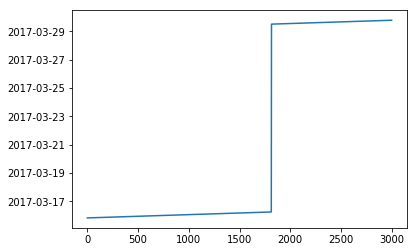

In [107]:
plt.plot(df.index[25000:28000])

A kink was observed in the time series that provoked a closer look at the index column of the dataset.

In [110]:
df.index[26700:27000]

DatetimeIndex(['2017-03-16 05:22:00', '2017-03-16 05:22:20',
               '2017-03-16 05:22:40', '2017-03-16 05:23:00',
               '2017-03-16 05:23:20', '2017-03-16 05:23:40',
               '2017-03-16 05:24:00', '2017-03-16 05:24:20',
               '2017-03-16 05:24:40', '2017-03-16 05:25:00',
               ...
               '2017-03-29 12:58:40', '2017-03-29 12:59:00',
               '2017-03-29 12:59:20', '2017-03-29 12:59:40',
               '2017-03-29 13:00:00', '2017-03-29 13:00:20',
               '2017-03-29 13:00:40', '2017-03-29 13:01:00',
               '2017-03-29 13:01:20', '2017-03-29 13:01:40'],
              dtype='datetime64[ns]', name='date', length=300, freq=None)

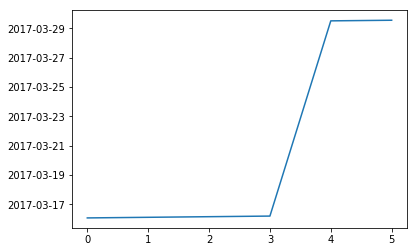

In [121]:
plt.plot(range(len(unique_time[145:151])),unique_time[145:151])

A discontinuity in the timestamps was detected i.e. the data jumps from 16 March 2017 to 29 March 2017.

In [204]:
df_slice.index[0], df_slice.index[-1]

(Timestamp('2017-04-11 00:00:00'), Timestamp('2017-09-09 23:59:40'))

In [84]:
i = 0
j = 0
date_freq = {}
while i < len(dates):
    print(i)
    new_date = dates[i]
    count = 0
    print(j)
    while j < len(dates) and (dates[j] == dates[i]):
        j+=1
        count +=1
    date_freq[new_date] = count
    i = j

0
0
4134
4134
8454
8454
12774
12774
17094
17094
21414
21414
25734
25734
26814
26814
28974
28974
33294
33294
37614
37614
41934
41934
46254
46254
50574
50574
54894
54894
59214
59214
63534
63534
67854
67854
72174
72174
76494
76494
80813
80813
85133
85133
89453
89453
93773
93773
98093
98093
102413
102413
106733
106733
111053
111053
115373
115373
119693
119693
124013
124013
128333
128333
132653
132653
136973
136973
141293
141293
145613
145613
149933
149933
154253
154253
158573
158573
162893
162893
167213
167213
171533
171533
175853
175853
180173
180173
184493
184493
188813
188813
193133
193133
197453
197453
201773
201773
206093
206093
210413
210413
214733
214733
219053
219053
223373
223373
227693
227693
232013
232013
236333
236333
240653
240653
244973
244973
249293
249293
253613
253613
257933
257933
262253
262253
266573
266573
270893
270893
275213
275213
279533
279533
283853
283853
288173
288173
292493
292493
296813
296813
301133
301133
305453
305453
309773
309773
314093
314093
318413
31841

In [85]:
len(date_freq)

172

In [86]:
date_freq

{datetime.date(2017, 3, 10): 4134,
 datetime.date(2017, 3, 11): 4320,
 datetime.date(2017, 3, 12): 4320,
 datetime.date(2017, 3, 13): 4320,
 datetime.date(2017, 3, 14): 4320,
 datetime.date(2017, 3, 15): 4320,
 datetime.date(2017, 3, 16): 1080,
 datetime.date(2017, 3, 29): 2160,
 datetime.date(2017, 3, 30): 4320,
 datetime.date(2017, 3, 31): 4320,
 datetime.date(2017, 4, 1): 4320,
 datetime.date(2017, 4, 2): 4320,
 datetime.date(2017, 4, 3): 4320,
 datetime.date(2017, 4, 4): 4320,
 datetime.date(2017, 4, 5): 4320,
 datetime.date(2017, 4, 6): 4320,
 datetime.date(2017, 4, 7): 4320,
 datetime.date(2017, 4, 8): 4320,
 datetime.date(2017, 4, 9): 4320,
 datetime.date(2017, 4, 10): 4319,
 datetime.date(2017, 4, 11): 4320,
 datetime.date(2017, 4, 12): 4320,
 datetime.date(2017, 4, 13): 4320,
 datetime.date(2017, 4, 14): 4320,
 datetime.date(2017, 4, 15): 4320,
 datetime.date(2017, 4, 16): 4320,
 datetime.date(2017, 4, 17): 4320,
 datetime.date(2017, 4, 18): 4320,
 datetime.date(2017, 4, 19): 

In [202]:
df_slice = df[df.index >= '2017-04-11']

In [88]:
df_slice

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:00:00,0.614583,0.372702,0.365440,0.506591,0.652199,0.430148,0.681342,0.375840,0.339795,0.389643,...,0.347189,0.765358,0.822100,0.762239,0.549450,0.570935,0.526715,0.557980,0.624161,0.168357
2017-04-11 00:00:20,0.614583,0.372702,0.364286,0.503709,0.693315,0.431797,0.681612,0.373440,0.331863,0.390309,...,0.346952,0.775565,0.805014,0.757342,0.552463,0.584717,0.522038,0.563179,0.624161,0.168357
2017-04-11 00:00:40,0.614583,0.372702,0.363134,0.505784,0.687465,0.433447,0.681882,0.370940,0.357481,0.389979,...,0.345616,0.777148,0.791314,0.750937,0.569479,0.591743,0.522911,0.566392,0.624161,0.168357
2017-04-11 00:01:00,0.614583,0.372702,0.362593,0.507861,0.681614,0.435097,0.682152,0.368439,0.383099,0.389649,...,0.344280,0.778733,0.777612,0.744533,0.586495,0.598770,0.523785,0.569603,0.624161,0.168357
2017-04-11 00:01:20,0.614583,0.372702,0.363123,0.509935,0.675764,0.436752,0.682422,0.365939,0.408722,0.389319,...,0.342944,0.780317,0.763910,0.738128,0.603511,0.605796,0.524658,0.572817,0.624161,0.168357
2017-04-11 00:01:40,0.614583,0.372702,0.363653,0.509238,0.707350,0.438402,0.682692,0.365803,0.389178,0.394700,...,0.342868,0.747535,0.781302,0.741526,0.565150,0.606176,0.556676,0.585758,0.624161,0.168357
2017-04-11 00:02:00,0.614583,0.372702,0.362671,0.508821,0.711054,0.440051,0.682962,0.365803,0.377970,0.398782,...,0.343310,0.734983,0.787269,0.741882,0.549056,0.590151,0.580049,0.608357,0.624161,0.168357
2017-04-11 00:02:20,0.614583,0.372702,0.360761,0.510942,0.685294,0.440850,0.683232,0.366443,0.369710,0.401667,...,0.344393,0.748574,0.783612,0.740019,0.547047,0.557240,0.576275,0.630693,0.624161,0.168357
2017-04-11 00:02:40,0.614583,0.372702,0.364040,0.515039,0.677581,0.440850,0.683532,0.367678,0.355086,0.402971,...,0.345056,0.760301,0.787693,0.741599,0.529414,0.546386,0.546405,0.621179,0.624161,0.168357


In [89]:
date_list = date_freq.keys()
slice_date_list = []
for date in date_list:
    if date >=  datetime.strptime('2017-04-11','%Y-%m-%d').date():
        slice_date_list.append(date)

In [90]:
len(slice_date_list), len(slice_date_list)*24, len(slice_date_list)*24*180 == len(df_slice)

(152, 3648, True)

For the sake of simplicity, a slice of the dataframe conatining uniform number of readings for each day without any discontinuites was taken up for further analysis.

##### the dataframe slice would now be used for further analysis.

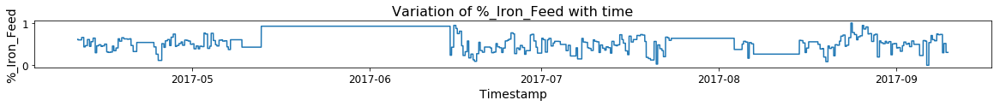

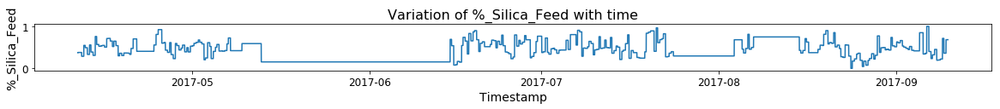

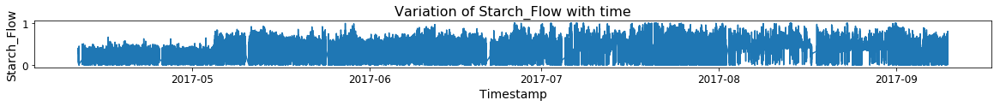

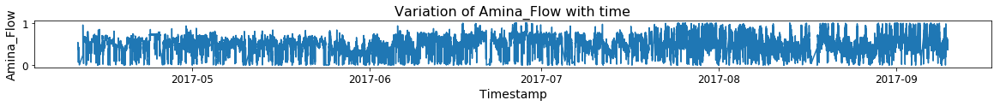

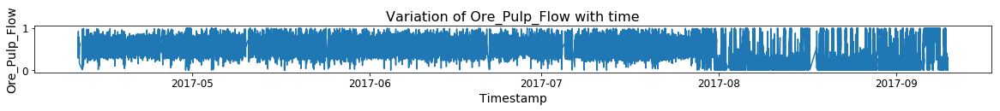

...

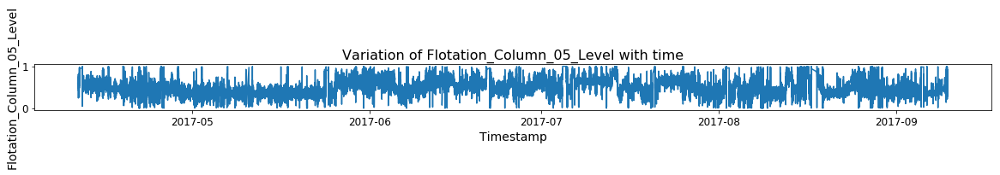

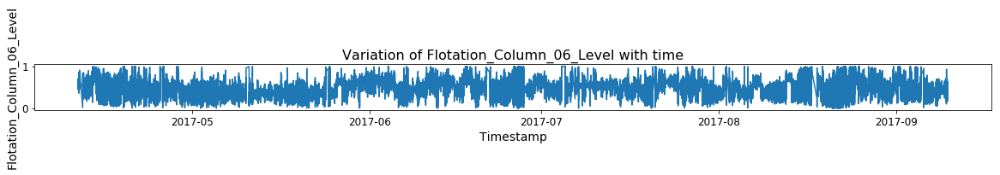

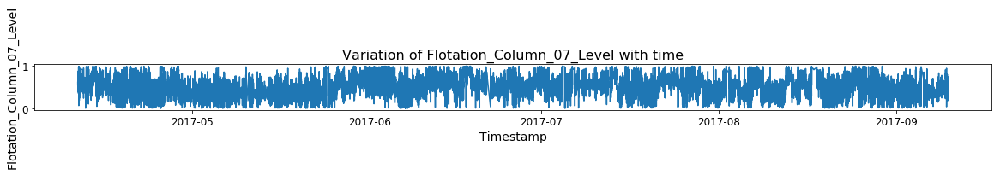

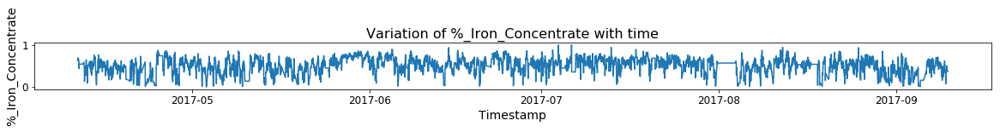

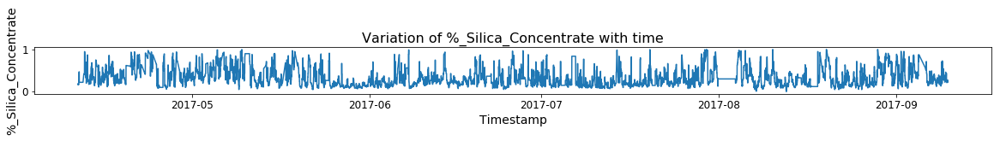

In [176]:
for col in df_slice.columns:
    plt.figure(figsize=(20,1))
    plt.plot(df_slice.index,df_slice[col])
    plt.xlabel('Timestamp', fontsize=14)
    plt.ylabel(col, fontsize = 14)
    plt.xticks(fontsize = 12)
    plt.yticks(fontsize = 12)
    plt.title('Variation of ' + col + ' with time', fontsize = 16)

In [139]:
corr_matrix = df_slice.corr()

<Figure size 720x720 with 0 Axes>

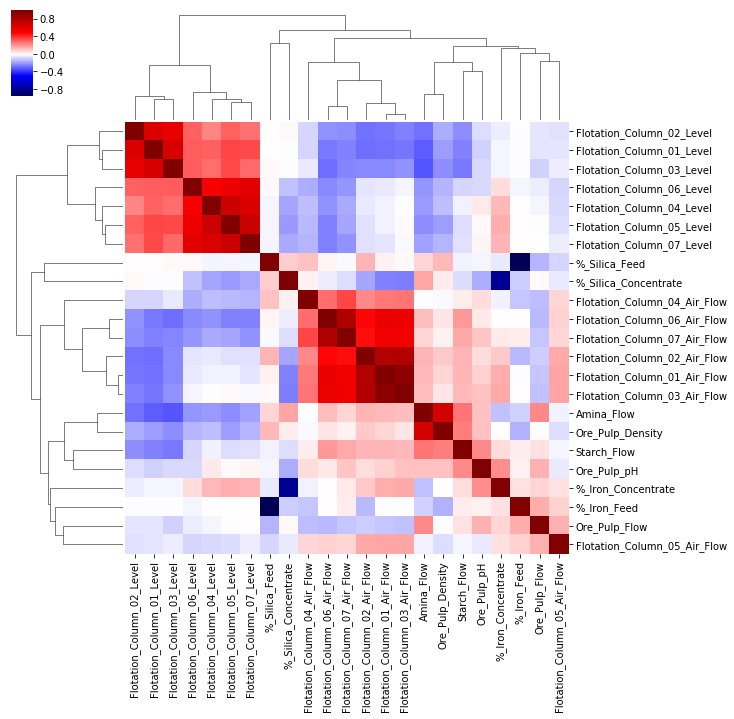

In [134]:
plt.figure(figsize = (10,10))
ax = sns.clustermap(corr_matrix,cmap='seismic',center = 0.0)

## Seasonality check

In [205]:
months = [4,5,6,7,8,9]

In [226]:
dist_1 = np.random.randn(1000) + 0.05
dist_2 = np.random.randn(100)
t_stat, p = ttest_ind(dist_1,dist_2)
print(p)
#ttest_ind

0.9225187837198102


In [211]:
df_slice.index[100].date().month

4

In [213]:
df_month = df_slice[df_slice.index.date().month == 2]

TypeError: 'numpy.ndarray' object is not callable

In [223]:
def get_month_slice(df, month):
    time_list = df.index
    time_slice = []
    for time in time_list:
        if time.date().month == month:
            time_slice.append(time)
    df_month = df.loc[time_slice]
    print(len(time_slice))
    return df_month

In [225]:
for month in months:
    print(len(get_month_slice(df_slice, month)))

86400
86400
133920
133920
129600
129600
133920
133920
133920
133920
38880
38880


create a matrix with p values of the t test between different column slices

In [ ]:
t_test_p_dict = {}
for col in df_slice.columns:
    df_col = df_slice[col]
    p_list = []
    for month in months:
        samp1 = list(get_month_slice(df_slice,month)[col])
        for month

In [244]:
p_sup_array = []
for col in df_slice.columns:
    df_col = df_slice[col]
    p_array = []
    for month in months:
        samp1 = list(get_month_slice(df_slice,month)[col])
        p_list = []
        for month in months:
            test_samp = list(get_month_slice(df_slice,month)[col])
            t_stat, p = ttest_ind(samp1,test_samp)
            p_list.append(p)
        p_array.append(p_list)
    p_sup_array.append(p_array)
p_sup_array = np.array(p_sup_array)

86400
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
129600
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
38880
86400
133920
129600
133920
133920
38880
86400
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
129600
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
38880
86400
133920
129600
133920
133920
38880
86400
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
129600
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
38880
86400
133920
129600
133920
133920
38880
86400
86400
133920
129600
133920
133920
38880
133920
86400
133920
129600
133920
133920
38880
129600
86400
133920
129600
133920
133920
38880
133920
86400
133920


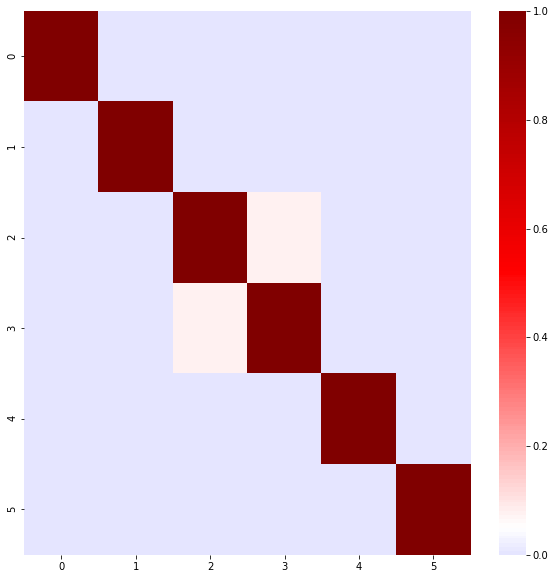

In [241]:
plt.figure(figsize = (10,10))
ax = sns.heatmap(p_array,cmap='seismic',center = 0.05)

In [246]:
p_sup_array.shape

(23, 6, 6)

In [255]:
months

[4, 5, 6, 7, 8, 9]

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


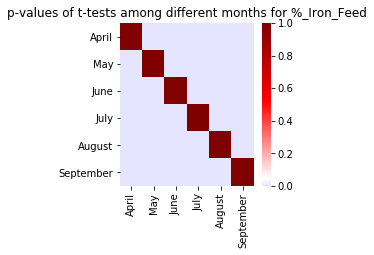

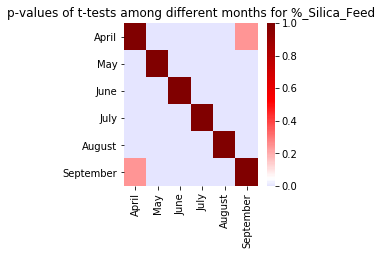

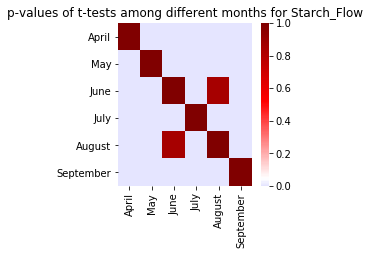

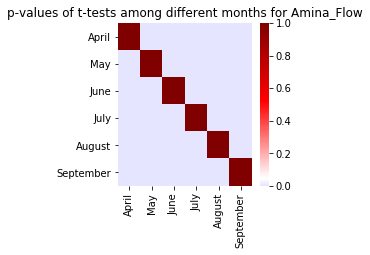

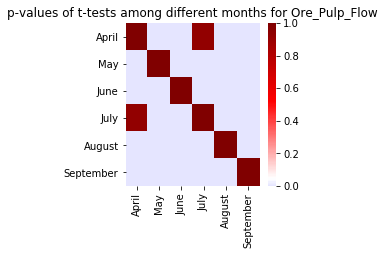

...

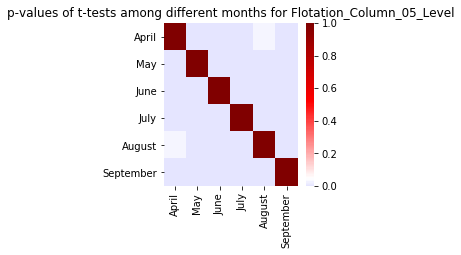

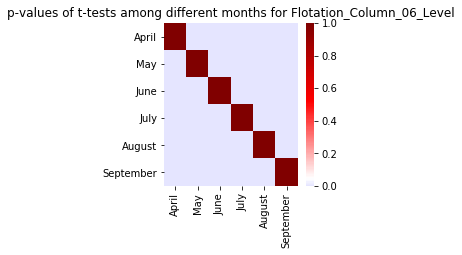

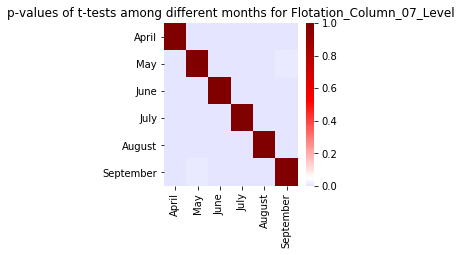

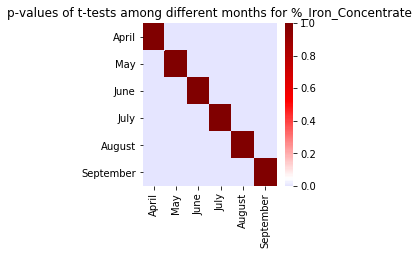

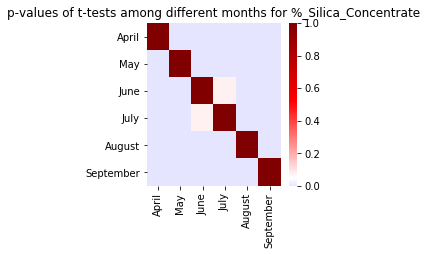

In [256]:
months_dict = {1: 'January',
              2: 'February',
              3: 'March',
              4: 'April',
              5: 'May',
              6: 'June',
              7: 'July',
              8: 'August',
              9: 'September',
              10: 'October',
              11: 'November',
              12: 'December'}
for ix in range(23):
    plt.figure(figsize = (3,3))
    plt.title('p-values of t-tests among different months for ' + df.columns[ix])
    ax = sns.heatmap(p_sup_array[ix],cmap='seismic',center = 0.05,xticklabels=[months_dict[mon] for mon in months],yticklabels=[months_dict[mon] for mon in months])
    

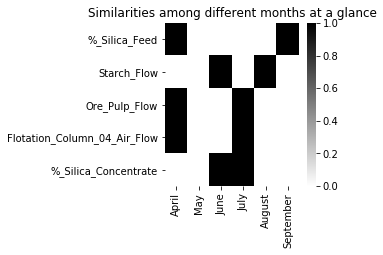

In [261]:
similarity_matrix = [[1,0,0,0,0,1],[0,0,1,0,1,0],[1,0,0,1,0,0],[1,0,0,1,0,0],[0,0,1,1,0,0]]
plt.figure(figsize = (3,3))
plt.title('Similarities among different months at a glance')
ax = sns.heatmap(similarity_matrix,cmap='binary',center = 0.5,xticklabels=[months_dict[mon] for mon in months],yticklabels=[df_slice.columns[inx] for inx in [1,2,4,10,22]])

In [243]:
p_array.shape

(6, 6)

In [232]:
p_list

[0.0, 1.0, 0.0, 0.0, 0.0, 7.507013888884389e-159]

In [238]:
print(p_array)

None


### ARIMA modelling

In [91]:
p = d = q = range(0, 2)

In [92]:
print(p,d,q)

range(0, 2) range(0, 2) range(0, 2)


In [93]:
import itertools
pdq = list(itertools.product(p, d, q))

In [94]:
#pdq

In [95]:
#seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [96]:
#seasonal_pdq

In [97]:
test_series = df_slice['Ore_Pulp_Density']

In [118]:
model = ARIMA(test_series, order=(10,2,0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency 20S will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency 20S will be used.
  % freq, ValueWarning)


                              ARIMA Model Results                              
Dep. Variable:     D2.Ore_Pulp_Density   No. Observations:               656638
Model:                 ARIMA(10, 2, 0)   Log Likelihood             2132775.920
Method:                        css-mle   S.D. of innovations              0.009
Date:                 Sun, 18 Aug 2019   AIC                       -4265527.839
Time:                         16:06:49   BIC                       -4265391.101
Sample:                     04-11-2017   HQIC                      -4265489.562
                          - 09-09-2017                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                      -1.227e-09    2.7e-06     -0.000      1.000   -5.29e-06    5.29e-06
ar.L1.D2.Ore_Pulp_Density     -0.6516      0.001   -529.596      0.000     

In [119]:
residuals = pd.DataFrame(model_fit.resid)

In [120]:
residuals.columns = ['Error']

In [121]:
residuals.head()

,Error
date,
2017-04-11 00:00:40,1.226956e-09
2017-04-11 00:01:00,1.711475e-09
2017-04-11 00:01:20,2.181990e-09
2017-04-11 00:01:40,2.603466e-09
2017-04-11 00:02:00,2.943077e-09


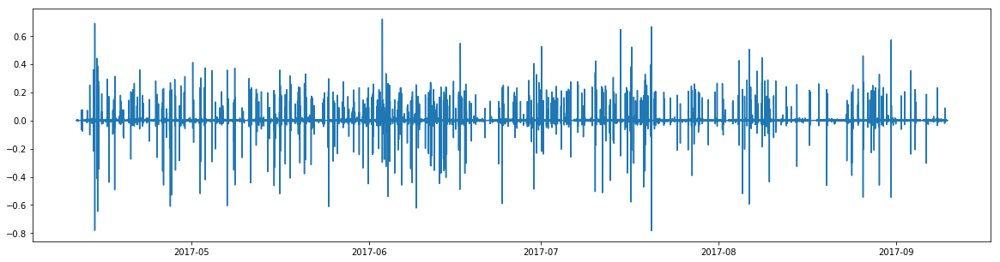

In [122]:
plt.figure(figsize=(20,5))
plt.plot(residuals)
plt.title('Plot showing the residuals from ARIMA model-fitting')
plt.xlabel('Timestamp')
plt.ylabel('Residuals')

(array([6.00000e+01, 6.80000e+01, 7.40000e+01, 7.10000e+01, 8.50000e+01,
        7.80000e+01, 7.30000e+01, 1.03000e+02, 9.90000e+01, 1.02000e+02,
        9.90000e+01, 8.00000e+01, 9.00000e+01, 9.20000e+01, 9.60000e+01,
        1.37000e+02, 1.16000e+02, 1.33000e+02, 1.41000e+02, 1.29000e+02,
        1.59000e+02, 1.41000e+02, 1.71000e+02, 1.52000e+02, 1.57000e+02,
        1.50000e+02, 1.84000e+02, 1.82000e+02, 1.89000e+02, 1.99000e+02,
        2.22000e+02, 2.35000e+02, 2.13000e+02, 2.27000e+02, 2.48000e+02,
        2.65000e+02, 2.81000e+02, 3.45000e+02, 3.36000e+02, 4.31000e+02,
        4.90000e+02, 6.02000e+02, 7.23000e+02, 9.76000e+02, 1.30300e+03,
        1.85800e+03, 2.79900e+03, 4.54900e+03, 8.18200e+03, 1.52380e+04,
        3.26300e+04, 8.82770e+04, 4.15533e+05, 3.36210e+04, 1.56640e+04,
        8.46000e+03, 4.87100e+03, 2.98300e+03, 1.94000e+03, 1.30800e+03,
        9.05000e+02, 6.82000e+02, 4.85000e+02, 3.92000e+02, 3.12000e+02,
        2.51000e+02, 2.10000e+02, 1.65000e+02, 1.35

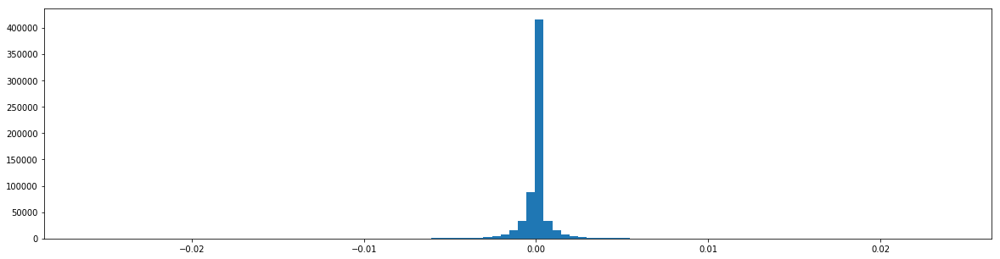

In [123]:
plt.figure(figsize=(20,5))
plt.hist(residuals['Error'],bins=100, range=(min(residuals['Error'])/30,max(residuals['Error'])/30))
plt.title('Histogram of residuals from the ARIMA model-fitting')
plt.ylabel('Frequency')
plt.xlabel('Residual value')

In [124]:
residuals.describe()

,Error
count,6.566380e+05
mean,8.573254e-10
std,9.400782e-03
min,-7.821860e-01
25%,-6.461944e-05
50%,5.275965e-09
75%,2.307210e-05
max,7.185088e-01


In [125]:
res_mean = np.mean(residuals['Error'])
print(res_mean)
res_std = np.std(residuals['Error'])
print(res_std)
dist_1 = residuals['Error']
dist_2 = res_std * np.random.randn(len(dist_1))
ks_stat, p = ks_2samp(dist_1,dist_2)
t_stat, p_t = ttest_ind(dist_1,dist_2)

8.5732536160751e-10
0.009400774658603365


In [126]:
print(ks_stat,p)
print(t_stat, p_t)

0.39991288959822613 0.0
-0.6654660628674627 0.5057525598195556


In [127]:
ks_stat,p = kstest(dist_1,'norm')

In [128]:
print(ks_stat,p)

0.49151799264100915 0.0


In [129]:
model_fit.cov_params()

,const,ar.L1.D2.Ore_Pulp_Density,ar.L2.D2.Ore_Pulp_Density,ar.L3.D2.Ore_Pulp_Density,ar.L4.D2.Ore_Pulp_Density,ar.L5.D2.Ore_Pulp_Density,ar.L6.D2.Ore_Pulp_Density,ar.L7.D2.Ore_Pulp_Density,ar.L8.D2.Ore_Pulp_Density,ar.L9.D2.Ore_Pulp_Density,ar.L10.D2.Ore_Pulp_Density
const,7.278828e-12,-5.600927e-16,-8.652568e-16,-1.101942e-15,-1.253152e-15,-1.292548e-15,-1.302008e-15,-1.285294e-15,-1.195383e-15,-1.054117e-15,-7.602303e-16
ar.L1.D2.Ore_Pulp_Density,-5.600927e-16,1.513789e-06,9.747884e-07,8.051364e-07,6.571708e-07,5.377797e-07,4.830876e-07,4.362570e-07,2.744244e-07,2.096245e-07,1.496823e-07
ar.L2.D2.Ore_Pulp_Density,-8.652568e-16,9.747884e-07,2.126690e-06,1.472518e-06,1.201178e-06,9.603291e-07,8.010889e-07,7.108339e-07,5.479866e-07,3.297949e-07,2.096224e-07
ar.L3.D2.Ore_Pulp_Density,-1.101942e-15,8.051364e-07,1.472518e-06,2.525886e-06,1.784042e-06,1.426791e-06,1.150369e-06,9.586474e-07,7.657840e-07,5.479830e-07,2.744205e-07
ar.L4.D2.Ore_Pulp_Density,-1.253152e-15,6.571708e-07,1.201178e-06,1.784042e-06,2.761425e-06,1.938414e-06,1.548931e-06,1.242263e-06,9.586427e-07,7.108273e-07,4.362518e-07
ar.L5.D2.Ore_Pulp_Density,-1.292548e-15,5.377797e-07,9.603291e-07,1.426791e-06,1.938414e-06,2.826742e-06,1.970805e-06,1.548925e-06,1.150361e-06,8.010805e-07,4.830813e-07
ar.L6.D2.Ore_Pulp_Density,-1.302008e-15,4.830876e-07,8.010889e-07,1.150369e-06,1.548931e-06,1.970805e-06,2.826734e-06,1.938403e-06,1.426779e-06,9.603179e-07,5.377714e-07
ar.L7.D2.Ore_Pulp_Density,-1.285294e-15,4.362570e-07,7.108339e-07,9.586474e-07,1.242263e-06,1.548925e-06,1.938403e-06,2.761406e-06,1.784025e-06,1.201163e-06,6.571611e-07
ar.L8.D2.Ore_Pulp_Density,-1.195383e-15,2.744244e-07,5.479866e-07,7.657840e-07,9.586427e-07,1.150361e-06,1.426779e-06,1.784025e-06,2.525860e-06,1.472500e-06,8.051247e-07
ar.L9.D2.Ore_Pulp_Density,-1.054117e-15,2.096245e-07,3.297949e-07,5.479830e-07,7.108273e-07,8.010805e-07,9.603179e-07,1.201163e-06,1.472500e-06,2.126664e-06,9.747740e-07


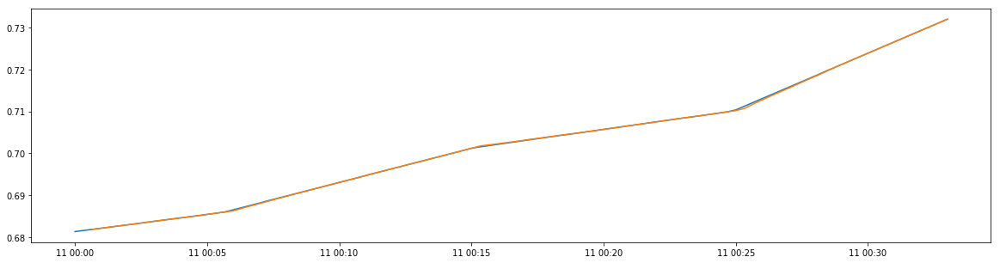

In [130]:
plt.figure(figsize=(20,5))
#plt.plot(model_fit.fittedvalues[:100])
plt.plot(test_series[:100])
plt.plot(test_series[:100] - dist_1[:100])
#plt.plot(dist_1[:100])

In [224]:
np.mean(model_fit.fittedvalues), np.mean(test_series)

(-4.318918804764556e-07, 0.470940395601272)

Fit linear regression model on shifted variables; check feature importances;

Fit RF model on shifted variables; check feature importance; remove less important ones

Fit ARIMA only on concentrate; compare to rf model.

### ARIMA on output variable

In [317]:
y_ar = df_slice[df_slice.columns[-1]]

In [322]:
X_ar = y_ar.values
size = int(len(X_ar) * 0.7)
train, test = X_ar[0:size], X_ar[size:len(X_ar)]
history = [x for x in train]
predictions = []

model_ar = ARIMA(history, order=(10,1,0))
model_ar_fit = model_ar.fit(disp=0)
output = model_ar_fit.forecast(steps=len(test))
print(len(output[0]))

196993


"\nfor t in range(len(test)):\n    model_ar = ARIMA(history, order=(10,1,0))\n    model_ar_fit = model_ar.fit(disp=0)\n    output = model_ar_fit.forecast()\n    yhat = output[0]\n    predictions.append(yhat)\n    obs = test[t]\n    history.append(obs)\n    print('predicted=%f, expected=%f' % (yhat, obs))\n    "

In [323]:
predictions = output[0]
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)

Test MSE: 0.062


In [328]:
tot_size = len(test)
chunk_size = int(tot_size/10)
predictions = []

for t in range(0,len(test),chunk_size):
    model_ar = ARIMA(history, order=(10,1,0))
    model_ar_fit = model_ar.fit(disp=0)
    output = model_ar_fit.forecast(steps = chunk_size)
    yhat = output[0]
    predictions = np.append(predictions,yhat)
    print(len(predictions))
    obs = test[t:t+chunk_size]
    history = np.append(history,obs)
    print(len(history))
    
    #print('predicted=%f, expected=%f' % (yhat, obs))

error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)

19699
479346
39398
499045
59097
518744
78796
538443
98495
558142
118194
577841
137893
597540
157592
617239
177291
636938
196990
656637
216689
656640


ValueError: Found input variables with inconsistent numbers of samples: [196993, 216689]

In [329]:
len(test),len(predictions)

(196993, 216689)

In [338]:
error = mean_squared_error(test, predictions[:len(test)])
error_std = np.std((test-predictions[:len(test)])**2)
print('Test MSE: %.3f' % error)
print('Std dev: %.3f' % error_std)

Test MSE: 0.127
Std dev: 0.183


In [327]:
type(predictions)

numpy.ndarray

### Linear regression with displaced features

In [141]:
corr_matrix_2 = corr_matrix.apply(lambda x: np.abs(x))
corr_matrix_2.sort_values(by=['%_Silica_Concentrate'],ascending=False,inplace=True)

In [144]:
frf_cols = list(corr_matrix_2.index[2:9])

In [145]:
df_slice_lr = df_slice

In [147]:
lr_sel_cols = list(df_slice_lr.columns[:-2])
print(len(lr_sel_cols))

21


In [167]:
col_index = 0
for col in lr_sel_cols:
    col_data = list(df_slice_lr[col])
    nan_array = []
    for lag in range(1,11):
        print(lag)
        nan_array.append(np.nan)
        #print(len(col_data[:-lag]))
        new_col = nan_array + col_data[:-lag]
        df_slice_lr.insert(col_index,col+'_L'+str(lag),new_col)
        col_index +=1
    col_index +=1

1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10


In [184]:
df_slice_lr = df_slice_lr.dropna()

In [185]:
df_slice_lr.index[:15], df_slice.index[:15]

(DatetimeIndex(['2017-04-11 00:03:20', '2017-04-11 00:03:40',
                '2017-04-11 00:04:00', '2017-04-11 00:04:20',
                '2017-04-11 00:04:40', '2017-04-11 00:05:00',
                '2017-04-11 00:05:20', '2017-04-11 00:05:40',
                '2017-04-11 00:06:00', '2017-04-11 00:06:20',
                '2017-04-11 00:06:40', '2017-04-11 00:07:00',
                '2017-04-11 00:07:20', '2017-04-11 00:07:40',
                '2017-04-11 00:08:00'],
               dtype='datetime64[ns]', name='date', freq=None),
 DatetimeIndex(['2017-04-11 00:03:20', '2017-04-11 00:03:40',
                '2017-04-11 00:04:00', '2017-04-11 00:04:20',
                '2017-04-11 00:04:40', '2017-04-11 00:05:00',
                '2017-04-11 00:05:20', '2017-04-11 00:05:40',
                '2017-04-11 00:06:00', '2017-04-11 00:06:20',
                '2017-04-11 00:06:40', '2017-04-11 00:07:00',
                '2017-04-11 00:07:20', '2017-04-11 00:07:40',
                '2017-04-11 

In [189]:
y_lr = df_slice_lr[df_slice_lr.columns[-1]]

X_lr = df_slice_lr[df_slice_lr.columns[:-1]]

In [190]:
tscv = TimeSeriesSplit(n_splits=10)
f_index = 0
t_folds = []
MSE = []
MSE_train = []
MSE_std = []
MSE_std_train = []
R_sq = []
R_sq_train = []
model = LinearRegression()

for train_index, test_index in tscv.split(X_lr.index):
    #print("TRAIN_SIZE:", len(train_index), "TEST_SIZE:", len(test_index))
    X_train, X_test = X_lr.values[train_index], X_lr.values[test_index]
    y_train, y_test = y_lr.values[train_index], y_lr.values[test_index]

    model.fit(X_train, y_train)

    # Make predictions on testing set
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Compute training and testing accuracy
    trainACC = model.score(X_train, y_train)*100
    R_sq_train.append(trainACC)
    testACC = model.score(X_test, y_test)*100
    R_sq.append(testACC)

    trainMSE = mean_squared_error(y_train,y_train_pred)
    MSE_train.append(trainMSE)
    testMSE = mean_squared_error(y_test,y_test_pred)
    MSE.append(testMSE)

    trainMSEstd = np.std((y_train - y_train_pred)**2)
    MSE_std_train.append(trainMSEstd)
    testMSEstd = np.std((y_test - y_test_pred)**2)
    MSE_std.append(testMSEstd)
    
    f_index+=1
    print('Fold {}: Train R-squared = {}, Test R-squared = {}'.format(f_index,trainACC,testACC))
    print('Fold {}: Train MSE = {}, Test MSE = {}'.format(f_index,trainMSE,testMSE))
    print('Fold {}: Train MSE std = {}, Test MSE std = {}'.format(f_index,trainMSEstd,testMSEstd))
    t_folds.append(f_index)

results_df = pd.DataFrame()
results_df['TS_Folds'] = t_folds
results_df = results_df.set_index('TS_Folds')
results_df['MSE_test'] = MSE
results_df['MSE_train'] = MSE_train
results_df['MSE_std_test'] = MSE_std
results_df['MSE_std_train'] = MSE_std_train
results_df['R_squared_test'] = R_sq
results_df['R_squared_train'] = R_sq_train

Fold 1: Train R-squared = 79.67353838424252, Test R-squared = -8.626200301147513
Fold 1: Train MSE = 0.010457302202021481, Test MSE = 0.05918644943601467
Fold 1: Train MSE std = 0.01888113700048281, Test MSE std = 0.08978832835325404
Fold 2: Train R-squared = 74.45012924699836, Test R-squared = 34.82725487308523
Fold 2: Train MSE = 0.013611513089128406, Test MSE = 0.04402418155419368
Fold 2: Train MSE std = 0.022263901232704084, Test MSE std = 0.051992152454778943
Fold 3: Train R-squared = 69.95228840560995, Test R-squared = -0.711040849808775
Fold 3: Train MSE = 0.017457065769139798, Test MSE = 0.018446210655617176
Fold 3: Train MSE std = 0.025956045559914175, Test MSE std = 0.025445621631221278
Fold 4: Train R-squared = 72.92070149322035, Test R-squared = 3.5628085115432806
Fold 4: Train MSE = 0.016220248894609508, Test MSE = 0.0278392929630716
Fold 4: Train MSE std = 0.025095881084296022, Test MSE std = 0.040648951845305974
Fold 5: Train R-squared = 69.5913371958763, Test R-squared 

In [193]:
coeff_list = np.abs(model.coef_)

In [199]:
#plt.figure(figsize=(20,2))
#plt.bar(X_lr.columns,coeff_list)
#plt.xticks(rotation='vertical')

In [200]:
coeff_df = pd.DataFrame()
coeff_df['Feature'] = X_lr.columns
coeff_df = coeff_df.set_index('Feature')
coeff_df['beta'] = coeff_list
coeff_df.sort_values(['beta'], ascending=False, inplace=True)

In [201]:
coeff_df

,beta
Feature,
%_Iron_Concentrate,0.921631
%_Silica_Feed,0.265094
%_Iron_Feed,0.167671
Flotation_Column_01_Air_Flow_L10,0.102629
Ore_Pulp_pH,0.088045
%_Silica_Feed_L10,0.079588
Flotation_Column_01_Air_Flow,0.076058
%_Iron_Feed_L10,0.061000
Ore_Pulp_Density,0.040532


### Random forest with selected displaced features

In [204]:
df_slice.head()

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:00:00,0.614583,0.372702,0.365440,0.506591,0.652199,0.430148,0.681342,0.375840,0.339795,0.389643,...,0.347189,0.765358,0.822100,0.762239,0.549450,0.570935,0.526715,0.557980,0.624161,0.168357
2017-04-11 00:00:20,0.614583,0.372702,0.364286,0.503709,0.693315,0.431797,0.681612,0.373440,0.331863,0.390309,...,0.346952,0.775565,0.805014,0.757342,0.552463,0.584717,0.522038,0.563179,0.624161,0.168357
2017-04-11 00:00:40,0.614583,0.372702,0.363134,0.505784,0.687465,0.433447,0.681882,0.370940,0.357481,0.389979,...,0.345616,0.777148,0.791314,0.750937,0.569479,0.591743,0.522911,0.566392,0.624161,0.168357
2017-04-11 00:01:00,0.614583,0.372702,0.362593,0.507861,0.681614,0.435097,0.682152,0.368439,0.383099,0.389649,...,0.344280,0.778733,0.777612,0.744533,0.586495,0.598770,0.523785,0.569603,0.624161,0.168357
2017-04-11 00:01:20,0.614583,0.372702,0.363123,0.509935,0.675764,0.436752,0.682422,0.365939,0.408722,0.389319,...,0.342944,0.780317,0.763910,0.738128,0.603511,0.605796,0.524658,0.572817,0.624161,0.168357


In [206]:
corr_matrix_2['%_Silica_Concentrate']

%_Silica_Concentrate            1.000000
%_Iron_Concentrate              0.801281
Flotation_Column_03_Air_Flow    0.248251
Flotation_Column_01_Air_Flow    0.244151
Flotation_Column_05_Level       0.195888
Flotation_Column_04_Level       0.175222
Flotation_Column_02_Air_Flow    0.174608
Amina_Flow                      0.170148
Flotation_Column_07_Level       0.168569
Ore_Pulp_pH                     0.162366
Flotation_Column_06_Level       0.123504
%_Iron_Feed                     0.097384
%_Silica_Feed                   0.094842
Starch_Flow                     0.069432
Flotation_Column_07_Air_Flow    0.064635
Flotation_Column_05_Air_Flow    0.044836
Flotation_Column_06_Air_Flow    0.037659
Ore_Pulp_Density                0.035411
Flotation_Column_04_Air_Flow    0.023027
Flotation_Column_02_Level       0.013182
Ore_Pulp_Flow                   0.006724
Flotation_Column_03_Level       0.006354
Flotation_Column_01_Level       0.005802
Name: %_Silica_Concentrate, dtype: float64

Selection of 7 columns for feature shifting for RF model building.

In [207]:
rf_sel_cols = ['Flotation_Column_07_Air_Flow','Flotation_Column_01_Level','Flotation_Column_06_Level','Ore_Pulp_Density',
               'Starch_Flow','Ore_Pulp_Flow','%_Silica_Feed']

In [214]:
df_slice_rf = df_slice[df_slice.columns]

In [215]:
df_slice_rf.head()

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:00:00,0.614583,0.372702,0.365440,0.506591,0.652199,0.430148,0.681342,0.375840,0.339795,0.389643,...,0.347189,0.765358,0.822100,0.762239,0.549450,0.570935,0.526715,0.557980,0.624161,0.168357
2017-04-11 00:00:20,0.614583,0.372702,0.364286,0.503709,0.693315,0.431797,0.681612,0.373440,0.331863,0.390309,...,0.346952,0.775565,0.805014,0.757342,0.552463,0.584717,0.522038,0.563179,0.624161,0.168357
2017-04-11 00:00:40,0.614583,0.372702,0.363134,0.505784,0.687465,0.433447,0.681882,0.370940,0.357481,0.389979,...,0.345616,0.777148,0.791314,0.750937,0.569479,0.591743,0.522911,0.566392,0.624161,0.168357
2017-04-11 00:01:00,0.614583,0.372702,0.362593,0.507861,0.681614,0.435097,0.682152,0.368439,0.383099,0.389649,...,0.344280,0.778733,0.777612,0.744533,0.586495,0.598770,0.523785,0.569603,0.624161,0.168357
2017-04-11 00:01:20,0.614583,0.372702,0.363123,0.509935,0.675764,0.436752,0.682422,0.365939,0.408722,0.389319,...,0.342944,0.780317,0.763910,0.738128,0.603511,0.605796,0.524658,0.572817,0.624161,0.168357


In [216]:
for col in rf_sel_cols:
    col_index = list(df_slice_rf.columns).index(col)
    col_data = list(df_slice_rf[col])
    nan_array = []
    for lag in range(1,11):
        print(lag)
        nan_array.append(np.nan)
        #print(len(col_data[:-lag]))
        new_col = nan_array + col_data[:-lag]
        col_index +=1
        df_slice_rf.insert(col_index,col+'_L'+str(lag),new_col)

1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10
1
2
3
4
5
6
7
8
9
10


In [217]:
df_slice_rf.head()

,%_Iron_Feed,%_Silica_Feed,%_Silica_Feed_L1,%_Silica_Feed_L2,%_Silica_Feed_L3,%_Silica_Feed_L4,%_Silica_Feed_L5,%_Silica_Feed_L6,%_Silica_Feed_L7,%_Silica_Feed_L8,...,Flotation_Column_06_Level_L4,Flotation_Column_06_Level_L5,Flotation_Column_06_Level_L6,Flotation_Column_06_Level_L7,Flotation_Column_06_Level_L8,Flotation_Column_06_Level_L9,Flotation_Column_06_Level_L10,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:00:00,0.614583,0.372702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.557980,0.624161,0.168357
2017-04-11 00:00:20,0.614583,0.372702,0.372702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.563179,0.624161,0.168357
2017-04-11 00:00:40,0.614583,0.372702,0.372702,0.372702,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.566392,0.624161,0.168357
2017-04-11 00:01:00,0.614583,0.372702,0.372702,0.372702,0.372702,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.569603,0.624161,0.168357
2017-04-11 00:01:20,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,NaN,NaN,NaN,NaN,...,0.526715,NaN,NaN,NaN,NaN,NaN,NaN,0.572817,0.624161,0.168357


In [219]:
len(df_slice_rf.columns)

93

In [220]:
df_slice_rf = df_slice_rf.dropna()

In [222]:
df_slice_rf.head()

,%_Iron_Feed,%_Silica_Feed,%_Silica_Feed_L1,%_Silica_Feed_L2,%_Silica_Feed_L3,%_Silica_Feed_L4,%_Silica_Feed_L5,%_Silica_Feed_L6,%_Silica_Feed_L7,%_Silica_Feed_L8,...,Flotation_Column_06_Level_L4,Flotation_Column_06_Level_L5,Flotation_Column_06_Level_L6,Flotation_Column_06_Level_L7,Flotation_Column_06_Level_L8,Flotation_Column_06_Level_L9,Flotation_Column_06_Level_L10,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:03:20,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,...,0.580049,0.556676,0.524658,0.523785,0.522911,0.522038,0.526715,0.522219,0.624161,0.168357
2017-04-11 00:03:40,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,...,0.576275,0.580049,0.556676,0.524658,0.523785,0.522911,0.522038,0.512757,0.624161,0.168357
2017-04-11 00:04:00,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,...,0.546405,0.576275,0.580049,0.556676,0.524658,0.523785,0.522911,0.503262,0.624161,0.168357
2017-04-11 00:04:20,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,...,0.523329,0.546405,0.576275,0.580049,0.556676,0.524658,0.523785,0.493572,0.624161,0.168357
2017-04-11 00:04:40,0.614583,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,0.372702,...,0.514125,0.523329,0.546405,0.576275,0.580049,0.556676,0.524658,0.512619,0.624161,0.168357


In [223]:
y_rf = df_slice_rf[df_slice_rf.columns[-1]]
X_rf = df_slice_rf[df_slice_rf.columns[:-1]]

In [232]:
tscv = TimeSeriesSplit(n_splits=10)
f_index = 0
t_folds = []
MSE = []
MSE_train = []
MSE_std = []
MSE_std_train = []
R_sq = []
R_sq_train = []
model = RandomForestRegressor()

for train_index, test_index in tscv.split(X_lr.index):
    if f_index == 9:
    #print("TRAIN_SIZE:", len(train_index), "TEST_SIZE:", len(test_index))
        X_train, X_test = X_lr.values[train_index], X_lr.values[test_index]
        print('X split done!')
        y_train, y_test = y_lr.values[train_index], y_lr.values[test_index]
        print('Y split done!')
    
        model.fit(X_train, y_train)
        
        print('model fitted!')

        # Make predictions on testing set
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # Compute training and testing accuracy
        trainACC = model.score(X_train, y_train)*100
        R_sq_train.append(trainACC)
        testACC = model.score(X_test, y_test)*100
        R_sq.append(testACC)

        trainMSE = mean_squared_error(y_train,y_train_pred)
        MSE_train.append(trainMSE)
        testMSE = mean_squared_error(y_test,y_test_pred)
        MSE.append(testMSE)

        trainMSEstd = np.std((y_train - y_train_pred)**2)
        MSE_std_train.append(trainMSEstd)
        testMSEstd = np.std((y_test - y_test_pred)**2)
        MSE_std.append(testMSEstd)

    f_index+=1
    print('Fold {}: Train R-squared = {}, Test R-squared = {}'.format(f_index,trainACC,testACC))
    print('Fold {}: Train MSE = {}, Test MSE = {}'.format(f_index,trainMSE,testMSE))
    print('Fold {}: Train MSE std = {}, Test MSE std = {}'.format(f_index,trainMSEstd,testMSEstd))
    t_folds.append(f_index)

results_df = pd.DataFrame()
results_df['TS_Folds'] = t_folds
results_df = results_df.set_index('TS_Folds')
results_df['MSE_test'] = MSE
results_df['MSE_train'] = MSE_train
results_df['MSE_std_test'] = MSE_std
results_df['MSE_std_train'] = MSE_std_train
results_df['R_squared_test'] = R_sq
results_df['R_squared_train'] = R_sq_train

Fold 1: Train R-squared = 99.96244138973262, Test R-squared = -25.378813892926
Fold 1: Train MSE = 2.2497259540164467e-05, Test MSE = 0.036194101854836756
Fold 1: Train MSE std = 0.0003221377941862321, Test MSE std = 0.06975240861748305
Fold 2: Train R-squared = 99.96244138973262, Test R-squared = -25.378813892926
Fold 2: Train MSE = 2.2497259540164467e-05, Test MSE = 0.036194101854836756
Fold 2: Train MSE std = 0.0003221377941862321, Test MSE std = 0.06975240861748305
Fold 3: Train R-squared = 99.96244138973262, Test R-squared = -25.378813892926
Fold 3: Train MSE = 2.2497259540164467e-05, Test MSE = 0.036194101854836756
Fold 3: Train MSE std = 0.0003221377941862321, Test MSE std = 0.06975240861748305
Fold 4: Train R-squared = 99.96244138973262, Test R-squared = -25.378813892926
Fold 4: Train MSE = 2.2497259540164467e-05, Test MSE = 0.036194101854836756
Fold 4: Train MSE std = 0.0003221377941862321, Test MSE std = 0.06975240861748305
Fold 5: Train R-squared = 99.96244138973262, Test R-

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


model fitted!
Fold 10: Train R-squared = 99.93638497524957, Test R-squared = 59.98051344675239
Fold 10: Train MSE = 3.2093406905878904e-05, Test MSE = 0.02351452903341691
Fold 10: Train MSE std = 0.00033772365569352997, Test MSE std = 0.036645772956322833


ValueError: Length of values does not match length of index

In [234]:
coeff_list_rf = model.feature_importances_

In [237]:
coeff_df_rf = pd.DataFrame()
coeff_df_rf['Feature'] = X_lr.columns
coeff_df_rf = coeff_df_rf.set_index('Feature')
coeff_df_rf['rf_importance'] = coeff_list_rf
coeff_df_rf.sort_values(['rf_importance'], ascending=False, inplace=True)

In [242]:
rf_sel_features = list(coeff_df_rf['rf_importance'].index[:100])
lr_sel_features = list(coeff_df['beta'].index[:100])
sel_features = set(rf_sel_features).intersection(set(lr_sel_features))
sel_features = list(sel_features)

In [244]:
sel_features

['Flotation_Column_03_Level_L8',
 'Ore_Pulp_pH_L6',
 'Amina_Flow',
 'Flotation_Column_01_Air_Flow',
 'Amina_Flow_L10',
 'Ore_Pulp_pH_L10',
 'Flotation_Column_04_Level_L1',
 'Ore_Pulp_pH',
 'Flotation_Column_01_Air_Flow_L7',
 'Flotation_Column_03_Level_L1',
 'Ore_Pulp_Density',
 'Flotation_Column_03_Level',
 'Amina_Flow_L2',
 'Ore_Pulp_Flow_L10',
 'Flotation_Column_01_Level_L10',
 'Starch_Flow_L10',
 'Ore_Pulp_Density_L1',
 '%_Iron_Feed',
 'Ore_Pulp_Density_L10',
 'Flotation_Column_03_Level_L10',
 'Ore_Pulp_pH_L3',
 'Flotation_Column_01_Air_Flow_L1',
 '%_Iron_Feed_L6',
 'Flotation_Column_04_Level',
 'Flotation_Column_01_Air_Flow_L8',
 'Flotation_Column_01_Air_Flow_L10',
 'Flotation_Column_01_Level',
 'Flotation_Column_03_Level_L9',
 'Amina_Flow_L9',
 'Flotation_Column_01_Air_Flow_L4',
 'Amina_Flow_L1',
 'Ore_Pulp_pH_L5',
 '%_Silica_Feed_L10',
 'Amina_Flow_L3',
 'Amina_Flow_L6',
 'Amina_Flow_L8',
 'Ore_Pulp_Density_L9',
 'Flotation_Column_01_Level_L8',
 'Flotation_Column_03_Level_L7',
 '

In [ ]:
for feat in sel_features:
    if feat in X_lr.columns:
        print('Yes')
    else:
        print('No')

In [260]:
X_rf = X_lr[sel_features]

In [261]:
tscv = TimeSeriesSplit(n_splits=10)
f_index = 0
t_folds = []
MSE = []
MSE_train = []
MSE_std = []
MSE_std_train = []
R_sq = []
R_sq_train = []
model = RandomForestRegressor()

for train_index, test_index in tscv.split(X_rf.index):
    
    #print("TRAIN_SIZE:", len(train_index), "TEST_SIZE:", len(test_index))
    X_train, X_test = X_rf.values[train_index], X_rf.values[test_index]
    print('X split done!')
    y_train, y_test = y_rf.values[train_index], y_rf.values[test_index]
    print('Y split done!')

    model.fit(X_train, y_train)

    print('model fitted!')

    # Make predictions on testing set
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Compute training and testing accuracy
    trainACC = model.score(X_train, y_train)*100
    R_sq_train.append(trainACC)
    testACC = model.score(X_test, y_test)*100
    R_sq.append(testACC)

    trainMSE = mean_squared_error(y_train,y_train_pred)
    MSE_train.append(trainMSE)
    testMSE = mean_squared_error(y_test,y_test_pred)
    MSE.append(testMSE)

    trainMSEstd = np.std((y_train - y_train_pred)**2)
    MSE_std_train.append(trainMSEstd)
    testMSEstd = np.std((y_test - y_test_pred)**2)
    MSE_std.append(testMSEstd)

    f_index+=1
    print('Fold {}: Train R-squared = {}, Test R-squared = {}'.format(f_index,trainACC,testACC))
    print('Fold {}: Train MSE = {}, Test MSE = {}'.format(f_index,trainMSE,testMSE))
    print('Fold {}: Train MSE std = {}, Test MSE std = {}'.format(f_index,trainMSEstd,testMSEstd))
    t_folds.append(f_index)

results_df = pd.DataFrame()
results_df['TS_Folds'] = t_folds
results_df = results_df.set_index('TS_Folds')
results_df['MSE_test'] = MSE
results_df['MSE_train'] = MSE_train
results_df['MSE_std_test'] = MSE_std
results_df['MSE_std_train'] = MSE_std_train
results_df['R_squared_test'] = R_sq
results_df['R_squared_train'] = R_sq_train

X split done!
Y split done!


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


model fitted!
Fold 1: Train R-squared = 99.99022727240593, Test R-squared = 54.00327346473291
Fold 1: Train MSE = 5.027749921314435e-06, Test MSE = 0.02506193645505818
Fold 1: Train MSE std = 0.00025090736875425036, Test MSE std = 0.038578938024778214
X split done!
Y split done!
model fitted!
Fold 2: Train R-squared = 99.98529641398012, Test R-squared = 60.650344147498124
Fold 2: Train MSE = 7.83323154552836e-06, Test MSE = 0.026580687831578995
Fold 2: Train MSE std = 0.00024263629498652128, Test MSE std = 0.03649453863003165
X split done!
Y split done!
model fitted!
Fold 3: Train R-squared = 99.97613416172653, Test R-squared = 35.961676228222636
Fold 3: Train MSE = 1.3865532057789721e-05, Test MSE = 0.011729244384321793
Fold 3: Train MSE std = 0.0003708966205637044, Test MSE std = 0.02607346527950458
X split done!
Y split done!
model fitted!
Fold 4: Train R-squared = 99.97676735976016, Test R-squared = -15.973463592961568
Fold 4: Train MSE = 1.3916136235023275e-05, Test MSE = 0.033478

In [313]:
param_grid = {'n_estimators': [int(x) for x in np.arange(10,100,10)],
              'max_depth': [int(x) for x in np.arange(1,100)] + [None],
              'min_samples_split': [2,5,10,20,30,40],
              'min_samples_leaf': [1,2,4,8,16,32],
              'min_weight_fraction_leaf': [0.0,0.2,0.4],
              'max_features': ['auto','sqrt','log2'],
              'max_leaf_nodes': [20,40,60,80,100,200,500] + [None],
              'min_impurity_decrease': [0.0,0.2,0.4,0.6,0.8],
              'bootstrap': [True, False],
              'warm_start': [False,True]}

In [311]:
'''{'warm_start': False, 'n_estimators': 40, 'min_weight_fraction_leaf': 0.4, 'min_samples_split': 10, 'min_samples_leaf': 8,
'min_impurity_decrease': 0.2, 'max_leaf_nodes': 60, 'max_features': 'log2', 'max_depth': 16, 'bootstrap': True}'''

train_indices_final, test_indices_final = train_test_split(list(X_rf.index),test_size=0.1,shuffle=False)
train_X = X_rf.loc[train_indices_final]
train_y = y_rf[train_indices_final]
test_X = X_rf.loc[test_indices_final]
test_y = y_rf[test_indices_final]

In [314]:
best_score = 0
n_iterations = 10
#iter_idx = 0

print ('Random Forest - Randomized Grid Search')
tscv = TimeSeriesSplit(n_splits=10)

grid_search = RandomizedSearchCV(RandomForestRegressor(), param_grid, n_iter=n_iterations, verbose=2,cv=tscv)
grid_search.fit(train_X, train_y)
print('Randomized Grid search done!')
if grid_search.best_score_*100 > best_score:
    best_model = grid_search.best_estimator_
    best_parameters = grid_search.best_params_

print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.3f}%".format(grid_search.best_score_*100))
print(best_model)
print(best_parameters)

print('Fitting best model')
best_model.fit(train_X,train_y)
print('Best model fitted!')
print('------------------------------')
print('R-squared of the best model on the test set = {:.3f}%'.format(best_model.score(test_X,test_y)*100))
print('RMSE of the best model on the test set = {:.3f}'.format((mean_squared_error(test_y,best_model.predict(test_X)))**0.5))
print('MSE on the test set = {:.3f}'.format(np.mean((test_y-best_model.predict(test_X))**2)))
print('MSE on the test set - sklearn MSE = {:.3f}'.format(mean_squared_error(test_y,best_model.predict(test_X))))
print('Standard deviation for MSE on the test set = {:.3f}'.format(np.std((test_y-best_model.predict(test_X))**2)))
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[1:],test_y[:-1])**0.5)))

Random Forest - Randomized Grid Search
Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV] warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False, total=   3.2s
[CV] warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.3s remaining:    0.0s


[CV]  warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False, total=   4.0s
[CV] warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False 
[CV]  warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False, total=   6.6s
[CV] warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, max_leaf_nodes=None, max_features=log2, max_depth=58, bootstrap=False 
[CV]  warm_start=True, n_estimators=20, min_weight_fraction_leaf=0.0, min_samples_split=2, min_samples_leaf=2, min_impurity_decrease=0.6, 

[CV]  warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.2, min_samples_split=2, min_samples_leaf=8, min_impurity_decrease=0.8, max_leaf_nodes=500, max_features=log2, max_depth=19, bootstrap=True, total=  42.8s
[CV] warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.2, min_samples_split=40, min_samples_leaf=16, min_impurity_decrease=0.8, max_leaf_nodes=100, max_features=log2, max_depth=21, bootstrap=False 
[CV]  warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.2, min_samples_split=40, min_samples_leaf=16, min_impurity_decrease=0.8, max_leaf_nodes=100, max_features=log2, max_depth=21, bootstrap=False, total=   5.7s
[CV] warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.2, min_samples_split=40, min_samples_leaf=16, min_impurity_decrease=0.8, max_leaf_nodes=100, max_features=log2, max_depth=21, bootstrap=False 
[CV]  warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.2, min_samples_split=40, min_samples_leaf=16, min_impurity_decrease=0.

[CV]  warm_start=True, n_estimators=70, min_weight_fraction_leaf=0.2, min_samples_split=30, min_samples_leaf=1, min_impurity_decrease=0.2, max_leaf_nodes=20, max_features=sqrt, max_depth=7, bootstrap=True, total= 1.3min
[CV] warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.4, min_samples_split=30, min_samples_leaf=8, min_impurity_decrease=0.0, max_leaf_nodes=60, max_features=sqrt, max_depth=55, bootstrap=True 
[CV]  warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.4, min_samples_split=30, min_samples_leaf=8, min_impurity_decrease=0.0, max_leaf_nodes=60, max_features=sqrt, max_depth=55, bootstrap=True, total=   6.2s
[CV] warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.4, min_samples_split=30, min_samples_leaf=8, min_impurity_decrease=0.0, max_leaf_nodes=60, max_features=sqrt, max_depth=55, bootstrap=True 
[CV]  warm_start=True, n_estimators=60, min_weight_fraction_leaf=0.4, min_samples_split=30, min_samples_leaf=8, min_impurity_decrease=0.0, max_leaf

[CV]  warm_start=False, n_estimators=80, min_weight_fraction_leaf=0.4, min_samples_split=10, min_samples_leaf=1, min_impurity_decrease=0.4, max_leaf_nodes=200, max_features=log2, max_depth=83, bootstrap=False, total= 1.2min
[CV] warm_start=False, n_estimators=40, min_weight_fraction_leaf=0.4, min_samples_split=5, min_samples_leaf=32, min_impurity_decrease=0.4, max_leaf_nodes=60, max_features=sqrt, max_depth=37, bootstrap=True 
[CV]  warm_start=False, n_estimators=40, min_weight_fraction_leaf=0.4, min_samples_split=5, min_samples_leaf=32, min_impurity_decrease=0.4, max_leaf_nodes=60, max_features=sqrt, max_depth=37, bootstrap=True, total=   4.0s
[CV] warm_start=False, n_estimators=40, min_weight_fraction_leaf=0.4, min_samples_split=5, min_samples_leaf=32, min_impurity_decrease=0.4, max_leaf_nodes=60, max_features=sqrt, max_depth=37, bootstrap=True 
[CV]  warm_start=False, n_estimators=40, min_weight_fraction_leaf=0.4, min_samples_split=5, min_samples_leaf=32, min_impurity_decrease=0.4, 

[CV]  warm_start=True, n_estimators=50, min_weight_fraction_leaf=0.0, min_samples_split=10, min_samples_leaf=2, min_impurity_decrease=0.0, max_leaf_nodes=None, max_features=sqrt, max_depth=34, bootstrap=False, total=20.6min


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 157.0min finished


Randomized Grid search done!
Best parameters: {'warm_start': True, 'n_estimators': 50, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 10, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': None, 'max_features': 'sqrt', 'max_depth': 34, 'bootstrap': False}
Best cross-validation score: 31.209%
RandomForestRegressor(bootstrap=False, criterion='mse', max_depth=34,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=2, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=True)
{'warm_start': True, 'n_estimators': 50, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 10, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': None, 'max_features': 'sqrt', 'max_depth': 34, 'bootstrap': False}
Fitting best model


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:308: UserWarning: Warm-start fitting without increasing n_estimators does not fit new trees.
  warn("Warm-start fitting without increasing n_estimators does not "


Best model fitted!
------------------------------
R-squared of the best model on the test set = 51.863%
RMSE of the best model on the test set = 0.167
MSE on the test set = 0.028
MSE on the test set - sklearn MSE = 0.028
Standard deviation for MSE on the test set = 0.040
Baseline for RMSE = 0.012


In [315]:
train_indices_final, test_indices_final = train_test_split(list(X_rf.index),test_size=0.3,shuffle=False)
train_X = X_rf.loc[train_indices_final]
train_y = y_rf[train_indices_final]
test_X = X_rf.loc[test_indices_final]
test_y = y_rf[test_indices_final]

In [316]:
print('Fitting best model')
best_model.fit(train_X,train_y)
print('Best model fitted!')
print('------------------------------')
print('R-squared of the best model on the test set = {:.3f}%'.format(best_model.score(test_X,test_y)*100))
print('RMSE of the best model on the test set = {:.3f}'.format((mean_squared_error(test_y,best_model.predict(test_X)))**0.5))
print('MSE on the test set = {:.3f}'.format(np.mean((test_y-best_model.predict(test_X))**2)))
print('MSE on the test set - sklearn MSE = {:.3f}'.format(mean_squared_error(test_y,best_model.predict(test_X))))
print('Standard deviation for MSE on the test set = {:.3f}'.format(np.std((test_y-best_model.predict(test_X))**2)))
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[1:],test_y[:-1])**0.5)))

Fitting best model


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:308: UserWarning: Warm-start fitting without increasing n_estimators does not fit new trees.
  warn("Warm-start fitting without increasing n_estimators does not "


Best model fitted!
------------------------------
R-squared of the best model on the test set = 83.052%
RMSE of the best model on the test set = 0.096
MSE on the test set = 0.009
MSE on the test set - sklearn MSE = 0.009
Standard deviation for MSE on the test set = 0.027
Baseline for RMSE = 0.011


In [337]:
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[60:],test_y[:-60]))))

Baseline for RMSE = 0.007


In [357]:
print('Std dev for baseline RMSE = {:.3f}'.format((np.std((np.array(test_y[1:])-np.array(test_y[:-1]))**2))))

Std dev for baseline RMSE = 0.005


In [354]:
len(test_y[60:]) - len(test_y[:-60])

(196929, 0)

In [355]:
type(test_y)

pandas.core.series.Series

In [278]:
for feat in df_slice.columns[:-1]:
    if feat not in sel_features:
        print('No')
        print(feat)

No
Ore_Pulp_Flow
No
Flotation_Column_02_Air_Flow
No
Flotation_Column_03_Air_Flow
No
Flotation_Column_04_Air_Flow
No
Flotation_Column_05_Air_Flow
No
Flotation_Column_06_Air_Flow
No
Flotation_Column_07_Air_Flow
No
Flotation_Column_02_Level
No
Flotation_Column_05_Level
No
Flotation_Column_07_Level


In [303]:
rf_sel_features = list(coeff_df_rf['rf_importance'].index[:80])
lr_sel_features = list(coeff_df['beta'].index[:45])
sel_features = set(rf_sel_features).union(set(lr_sel_features))
sel_features = list(sel_features)

In [304]:
len(sel_features)

95

In [306]:
for feat in df_slice.columns[:-1]:
    if feat not in sel_features:
        print('No')
        print(feat)
        sel_features.append(feat)

No
Flotation_Column_05_Air_Flow
No
Flotation_Column_06_Air_Flow
No
Flotation_Column_07_Air_Flow
No
Flotation_Column_02_Level
No
Flotation_Column_07_Level


In [307]:
len(sel_features)

100

In [308]:
X_rf = X_lr[sel_features]

In [309]:
X_rf.shape

(656630, 100)

RF model building over!!!

## Appendix

### Seasonal decomposition

In [189]:
#sorted_corr_matrix = corr_matrix.sort_values(by=corr_matrix.columns[1], ascending=False)

In [190]:
#sorted_corr_matrix = sorted_corr_matrix.sort_values(by=corr_matrix.columns[1], axis = 1, ascending=False)

In [193]:
#plt.figure(figsize = (10,10))
#ax = sns.heatmap(sorted_corr_matrix,cmap='seismic',center = 0.0)

In [198]:
dist_1 = np.random.randn(1000) + 0.01
dist_2 = np.random.randn(1000)
ks_stat, p = ks_2samp(dist_1,dist_2)
print(p)

0.1944481787046917


In [91]:
def get_optimum_seasonal_decomp(series, freq_lb, freq_ub, interval):
    p_list = []
    freq_list = []
    for freq_value in range(freq_lb,freq_ub,interval):
        decomp = seasonal_decompose(series, freq = freq_value)
        #seasonal_peaks = find_peaks(decomp.seasonal,height = 0)
        #residual_peaks = find_peaks(decomp.resid,height = 0)
        #seasonal_avg_peak = np.mean(seasonal_peaks[1]['peak_heights'])
        #print(seasonal_avg_peak)
        #residual_avg_peak = np.mean(residual_peaks[1]['peak_heights'])
        #print(residual_avg_peak)
        #mag_diff = seasonal_avg_peak - residual_avg_peak
        #print(mag_diff)
        res_mean = np.mean(decomp.resid)
        res_std = np.std(decomp.resid)
        dist_1 = decomp.resid
        dist_2 = res_std * np.random.randn(len(dist_1)) + res_mean
        ks_stat, p = ks_2samp(dist_1,dist_2)
        if p > 0.050000000:
            freq_list.append(freq_value)
            print(p)
            print(res_mean)
        p_list.append(p)
    return ('seasonal_decompose(series, freq = min(freq_list))', freq_list, p_list)

Visual inspection of the columns:
0,1,2,5,6,10,11,21,22

In [85]:
len(df.columns)

23

In [86]:
seasonal_check_cols = list(df.columns)
for index in [0,1,2,5,6,10,11,21,22]:
    seasonal_check_cols.remove(df.columns[index])

In [87]:
seasonal_check_cols

['Amina_Flow',
 'Ore_Pulp_Flow',
 'Flotation_Column_01_Air_Flow',
 'Flotation_Column_02_Air_Flow',
 'Flotation_Column_03_Air_Flow',
 'Flotation_Column_06_Air_Flow',
 'Flotation_Column_07_Air_Flow',
 'Flotation_Column_01_Level',
 'Flotation_Column_02_Level',
 'Flotation_Column_03_Level',
 'Flotation_Column_04_Level',
 'Flotation_Column_05_Level',
 'Flotation_Column_06_Level',
 'Flotation_Column_07_Level']

In [93]:
df.shape, (737453+6+1)/180

((737453, 23), 4097.0)

### Initial model building attempt

In [264]:
model_names = {'lr': 'Linear Regression',
              'rfr': 'Random Forest Regression',
              'gbr': 'Gradient Boosting Regressor'}

In [267]:
models = {
    'lr': LinearRegression(),
    'rfr': RandomForestRegressor(),
    'gbr': GradientBoostingRegressor()
}

In [282]:
resultDF = pd.DataFrame(columns=['model','hyperparams','train_acc','train_std','test_acc','test_std'])
MSEdf = pd.DataFrame(index = ['Fold_1','Fold_2','Fold_3','Fold_4','Fold_5','Fold_6','Fold_7','Fold_8','Fold_9','Fold_10'])
df_idx = 0

In [269]:
def crossValidate(typ, model, X, y, hyperparams='default', verbose=0):
    global df_idx
    
    # Update model hyperparameters if given
    if hyperparams is not 'default':
        model.set_params(**hyperparams)
    
    # Initialize scaler class
    #scaler = StandardScaler()
    
    # Get kFolds
    kfold = KFold(n_splits=10)
    kfold.get_n_splits(X)

    # Initialize storage vectors
    trainACC = np.zeros(10)
    testACC = np.zeros(10)
    trainMSE = np.zeros(10)
    testMSE = np.zeros(10)
    np_idx = 0

    # Loop through folds
    for train_idx, test_idx in kfold.split(X):
        X_train, X_test = X.values[train_idx], X.values[test_idx]
        y_train, y_test = y.values[train_idx], y.values[test_idx]

        # Scale data
        #X_train = scaler.fit_transform(X_train)
        #X_test = scaler.transform(X_test)

        # Fit to training set
        model.fit(X_train, y_train)

        # Make predictions on testing set
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Compute training and testing accuracy
        trainACC[np_idx] = model.score(X_train, y_train)*100
        testACC[np_idx] = model.score(X_test, y_test)*100
        
        trainMSE[np_idx] = mean_squared_error(y_train,y_train_pred)
        testMSE[np_idx] = mean_squared_error(y_test,y_test_pred)
        
        np_idx += 1
        
        # Print fold accuracy if verbose level 2
        if verbose == 2:
            print ("    Fold {}: Test Accuracy: {} Train Accuracy: {}%".format(np_idx, round(testACC[np_idx-1],3), round(trainACC[np_idx-1],3)))   

    # Print average accuracy if verbose level 1
    if verbose == 1 or verbose == 2:
        print ("  Average test Score: {}%({}%)".format(round(np.mean(testACC),3),round(np.std(testACC),3)))
        print ("  Average training Score: {}%({}%)".format(round(np.mean(trainACC),3),round(np.std(trainACC),3)))
    # Update dataframe
    resultDF.loc[df_idx, 'model'] = typ
    resultDF.loc[df_idx, 'hyperparams'] = str(hyperparams)
    resultDF.loc[df_idx, 'train_acc'] = trainACC.mean()
    resultDF.loc[df_idx, 'train_std'] = trainACC.std()
    resultDF.loc[df_idx, 'test_acc'] = testACC.mean()
    resultDF.loc[df_idx, 'test_std'] = testACC.std()
    df_idx += 1                                         
    
    MSEdf[typ+'_train_MSE'] = trainMSE
    MSEdf[typ+'_test_MSE'] = testMSE
    
    # Return average testing accuracy, and fitted model
    return testACC.mean(), model

In [273]:
df_slice_input = df_slice[df.columns[:-1]]

In [272]:
df_slice.columns

Index(['%_Iron_Feed', '%_Silica_Feed', 'Starch_Flow', 'Amina_Flow',
       'Ore_Pulp_Flow', 'Ore_Pulp_pH', 'Ore_Pulp_Density',
       'Flotation_Column_01_Air_Flow', 'Flotation_Column_02_Air_Flow',
       'Flotation_Column_03_Air_Flow', 'Flotation_Column_04_Air_Flow',
       'Flotation_Column_05_Air_Flow', 'Flotation_Column_06_Air_Flow',
       'Flotation_Column_07_Air_Flow', 'Flotation_Column_01_Level',
       'Flotation_Column_02_Level', 'Flotation_Column_03_Level',
       'Flotation_Column_04_Level', 'Flotation_Column_05_Level',
       'Flotation_Column_06_Level', 'Flotation_Column_07_Level',
       '%_Iron_Concentrate', '%_Silica_Concentrate'],
      dtype='object')

In [275]:
df_slice_output = df_slice[df.columns[-1]]

In [278]:
for name, m in models.items():
    print ("Fitting " + model_names[name] + " model")
    _, models[name] = crossValidate(model_names[name], m, df_slice_input, df_slice_output, 'default', 2)

Fitting Linear Regression model
    Fold 1: Test Accuracy: 65.329 Train Accuracy: 67.152%
    Fold 2: Test Accuracy: 61.921 Train Accuracy: 66.628%
    Fold 3: Test Accuracy: 43.165 Train Accuracy: 69.824%
    Fold 4: Test Accuracy: 19.649 Train Accuracy: 68.931%
    Fold 5: Test Accuracy: 58.878 Train Accuracy: 68.386%
    Fold 6: Test Accuracy: 58.852 Train Accuracy: 68.484%
    Fold 7: Test Accuracy: 55.3 Train Accuracy: 68.152%
    Fold 8: Test Accuracy: 59.872 Train Accuracy: 68.097%
    Fold 9: Test Accuracy: 54.055 Train Accuracy: 68.587%
    Fold 10: Test Accuracy: 71.273 Train Accuracy: 67.029%
  Average test Score: 54.829%(13.651%)
  Average training Score: 68.127%(0.913%)
Fitting Random Forest Regression model
    Fold 1: Test Accuracy: 43.119 Train Accuracy: 99.957%
    Fold 2: Test Accuracy: 50.815 Train Accuracy: 99.95%
    Fold 3: Test Accuracy: 44.074 Train Accuracy: 99.96%
    Fold 4: Test Accuracy: 27.585 Train Accuracy: 99.959%
    Fold 5: Test Accuracy: 48.355 Train

In [280]:
resultDF

,model,hyperparams,train_acc,train_std,test_acc,test_std
0,Linear Regression,default,68.127,0.912988,54.8293,13.6508
1,Linear Regression,default,68.127,0.912988,54.8293,13.6508
2,Random Forest Regression,default,99.9563,0.0033397,45.8005,9.71146
3,Gradient Boosting Regressor,default,79.551,0.62099,59.8063,7.23472


In [288]:
def crossValidate_time(typ, model, X, y, hyperparams='default', verbose=0):
    global df_idx
    
    # Update model hyperparameters if given
    if hyperparams is not 'default':
        model.set_params(**hyperparams)
    
    # Execute timeseries split
    #
    
    tscv = TimeSeriesSplit(n_splits=5)
    
    fitted_models = {}
    
    # Get kFolds
    #kfold = KFold(n_splits=10)
    #kfold.get_n_splits(X)

    # Initialize storage vectors
    trainACC = np.zeros(5)
    testACC = np.zeros(5)
    trainMSE = np.zeros(5)
    testMSE = np.zeros(5)
    np_idx = 0
    
    for train_index, test_index in tscv.split(X):
        #print("TRAIN_SIZE:", len(train_index), "TEST_SIZE:", len(test_index))
        X_train, X_test = X.values[train_index], X.values[test_index]
        y_train, y_test = y.values[train_index], y.values[test_index]

    # Loop through folds
    #for train_idx, test_idx in kfold.split(X):
    #    X_train, X_test = X.values[train_idx], X.values[test_idx]
    #    y_train, y_test = y.values[train_idx], y.values[test_idx]

        # Scale data
        #X_train = scaler.fit_transform(X_train)
        #X_test = scaler.transform(X_test)

        # Fit to training set
        model.fit(X_train, y_train)
        

        # Make predictions on testing set
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Compute training and testing accuracy
        trainACC[np_idx] = model.score(X_train, y_train)*100
        testACC[np_idx] = model.score(X_test, y_test)*100
        
        trainMSE[np_idx] = mean_squared_error(y_train,y_train_pred)
        testMSE[np_idx] = mean_squared_error(y_test,y_test_pred)
        
        np_idx += 1
        fitted_models['Fold_'+str(np_idx)] = model
        
        # Print fold accuracy if verbose level 2
        if verbose == 2:
            print ("    Fold {}: Test Accuracy: {} Train Accuracy: {}%".format(np_idx, round(testACC[np_idx-1],3), round(trainACC[np_idx-1],3)))   

    # Print average accuracy if verbose level 1
    if verbose == 1 or verbose == 2:
        print ("  Average test Score: {}%({}%)".format(round(np.mean(testACC),3),round(np.std(testACC),3)))
        print ("  Average training Score: {}%({}%)".format(round(np.mean(trainACC),3),round(np.std(trainACC),3)))
    # Update dataframe
    resultDF.loc[df_idx, 'model'] = typ
    resultDF.loc[df_idx, 'hyperparams'] = str(hyperparams)
    resultDF.loc[df_idx, 'train_acc'] = trainACC.mean()
    resultDF.loc[df_idx, 'train_std'] = trainACC.std()
    resultDF.loc[df_idx, 'test_acc'] = testACC.mean()
    resultDF.loc[df_idx, 'test_std'] = testACC.std()
    df_idx += 1                                         
    
    #MSEdf[typ+'_train_MSE'] = trainMSE
    #MSEdf[typ+'_test_MSE'] = testMSE
    
    # Return average testing accuracy, and fitted model
    return testACC.mean(), model, fitted_models

In [289]:
rf_mean, last_model, f_mod_dict = crossValidate_time('Random Forest Regression', RandomForestRegressor(), df_slice_input, df_slice_output, 'default', 2)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


    Fold 1: Test Accuracy: 60.609 Train Accuracy: 99.984%
    Fold 2: Test Accuracy: 16.073 Train Accuracy: 99.982%
    Fold 3: Test Accuracy: 11.9 Train Accuracy: 99.957%
    Fold 4: Test Accuracy: 53.556 Train Accuracy: 99.968%
    Fold 5: Test Accuracy: 51.418 Train Accuracy: 99.96%
  Average test Score: 38.711%(20.458%)
  Average training Score: 99.97%(0.011%)


In [311]:
f_mod_dict['Fold_1'].n_features_

22

In [312]:
param_grid =  {'n_estimators': [int(x) for x in np.arange(10,100,10)],
                      'max_features': ['auto','sqrt','log2'],
                      'max_depth': [int(x) for x in np.arange(1,5)] + [None],
                      'min_samples_split': [5,10,15],
                      'min_samples_leaf': [1,2,4],
                      'bootstrap': [True,False]}

In [322]:
train_indices_final, test_indices_final = train_test_split(list(df_slice_input.index),test_size=0.3,shuffle=False)

In [325]:
train_indices_final[-10:],test_indices_final[:10]

([Timestamp('2017-07-26 09:32:40'),
  Timestamp('2017-07-26 09:33:00'),
  Timestamp('2017-07-26 09:33:20'),
  Timestamp('2017-07-26 09:33:40'),
  Timestamp('2017-07-26 09:34:00'),
  Timestamp('2017-07-26 09:34:20'),
  Timestamp('2017-07-26 09:34:40'),
  Timestamp('2017-07-26 09:35:00'),
  Timestamp('2017-07-26 09:35:20'),
  Timestamp('2017-07-26 09:35:40')],
 [Timestamp('2017-07-26 09:36:00'),
  Timestamp('2017-07-26 09:36:20'),
  Timestamp('2017-07-26 09:36:40'),
  Timestamp('2017-07-26 09:37:00'),
  Timestamp('2017-07-26 09:37:20'),
  Timestamp('2017-07-26 09:37:40'),
  Timestamp('2017-07-26 09:38:00'),
  Timestamp('2017-07-26 09:38:20'),
  Timestamp('2017-07-26 09:38:40'),
  Timestamp('2017-07-26 09:39:00')])

In [326]:
train_X = df_slice_input.loc[train_indices_final]

train_y = df_slice_output[train_indices_final]

test_X = df_slice_input.loc[test_indices_final]
test_y = df_slice_output[test_indices_final]

In [329]:
best_score = 0
n_iterations = 10
#iter_idx = 0

print (model_names['rfr'])
tscv = TimeSeriesSplit(n_splits=5)

grid_search = RandomizedSearchCV(models['rfr'], param_grid, n_iter=n_iterations, verbose=2,cv=tscv)
grid_search.fit(train_X, train_y)
if grid_search.best_score_*100 > best_score:
    best_model = grid_search.best_estimator_
    best_parameters = grid_search.best_params_

print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}%".format(grid_search.best_score_*100))
print(best_model)
print(best_parameters)

best_model.fit(train_X,train_y)
print('Accuracy of the best model on the test set = {:.2f}%'.format(best_model.score(test_X,test_y)*100))

Random Forest Regression
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True, total=  10.7s
[CV] n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   10.9s remaining:    0.0s


[CV]  n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True, total=  28.7s
[CV] n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 
[CV]  n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True, total=  39.6s
[CV] n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 
[CV]  n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True, total=  55.3s
[CV] n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 
[CV]  n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True, total= 1.1min
[CV] n_estimators=70, min_samples_split=5, min_samples_leaf=4, max_features=sqrt, max_depth=4, bootstrap=True 
[CV]  n_estimators=70, min_samples_split=5, m

[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False, total=15.6min
[CV] n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False, total=27.0min
[CV] n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False, total=37.8min
[CV] n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=None, bootstrap=False, total=49.5min
[CV] n_estimators=90, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=4, bootstrap=True 
[CV]  n_estimators=90, 

[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed: 189.4min finished


Best parameters: {'n_estimators': 30, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 2, 'bootstrap': True}
Best cross-validation score: 46.40%
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=15,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)
{'n_estimators': 30, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 2, 'bootstrap': True}
Accuracy of the best model on the test set = 62.13%


In [334]:
best_model = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=15,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)
best_model.fit(train_X,train_y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=15,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [342]:
print('R^2 of the best model on the test set = {:.3f}%'.format(best_model.score(test_X,test_y)*100))
print('RMSE of the best model on the test set = {:.3f}'.format((mean_squared_error(test_y,best_model.predict(test_X)))**0.5))
print('MSE on the test set = {:.3f}'.format(np.mean((test_y-best_model.predict(test_X))**2)))
print('Standard deviation for MSE on the test set = {:.3f}'.format(np.std((test_y-best_model.predict(test_X))**2)))
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[1:],test_y[:-1])**0.5)))

R^2 of the best model on the test set = 62.130%
RMSE of the best model on the test set = 0.144
MSE on the test set = 0.021
Standard deviation for MSE on the test set = 0.032
Baseline for RMSE = 0.011


In [344]:
print(max((test_y-best_model.predict(test_X))**2))
print(min((test_y-best_model.predict(test_X))**2))

0.3322485891294292
3.458779508089125e-11


In [346]:
min(test_y), max(test_y)

(0.0, 1.0)

In [348]:
cols = corr_matrix.columns
rows = corr_matrix.index
output_col = corr_matrix['%_Silica_Concentrate']
output_col = output_col.apply(lambda x: np.absolute(x))

In [350]:
output_col.sort_values(ascending=False, inplace=True)

In [353]:
output_col

%_Silica_Concentrate            1.000000
%_Iron_Concentrate              0.801281
Flotation_Column_03_Air_Flow    0.248251
Flotation_Column_01_Air_Flow    0.244151
Flotation_Column_05_Level       0.195888
Flotation_Column_04_Level       0.175222
Flotation_Column_02_Air_Flow    0.174608
Amina_Flow                      0.170148
Flotation_Column_07_Level       0.168569
Ore_Pulp_pH                     0.162366
Flotation_Column_06_Level       0.123504
%_Iron_Feed                     0.097384
%_Silica_Feed                   0.094842
Starch_Flow                     0.069432
Flotation_Column_07_Air_Flow    0.064635
Flotation_Column_05_Air_Flow    0.044836
Flotation_Column_06_Air_Flow    0.037659
Ore_Pulp_Density                0.035411
Flotation_Column_04_Air_Flow    0.023027
Flotation_Column_02_Level       0.013182
Ore_Pulp_Flow                   0.006724
Flotation_Column_03_Level       0.006354
Flotation_Column_01_Level       0.005802
Name: %_Silica_Concentrate, dtype: float64

In [358]:
sel_cols = list(output_col.index[1:20])

In [359]:
sel_cols

['%_Iron_Concentrate',
 'Flotation_Column_03_Air_Flow',
 'Flotation_Column_01_Air_Flow',
 'Flotation_Column_05_Level',
 'Flotation_Column_04_Level',
 'Flotation_Column_02_Air_Flow',
 'Amina_Flow',
 'Flotation_Column_07_Level',
 'Ore_Pulp_pH',
 'Flotation_Column_06_Level',
 '%_Iron_Feed',
 '%_Silica_Feed',
 'Starch_Flow',
 'Flotation_Column_07_Air_Flow',
 'Flotation_Column_05_Air_Flow',
 'Flotation_Column_06_Air_Flow',
 'Ore_Pulp_Density',
 'Flotation_Column_04_Air_Flow',
 'Flotation_Column_02_Level']

In [360]:
df_slice_input = df_slice_input[sel_cols]
train_X = df_slice_input.loc[train_indices_final]

train_y = df_slice_output[train_indices_final]

test_X = df_slice_input.loc[test_indices_final]
test_y = df_slice_output[test_indices_final]

In [361]:
best_model = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=15,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)
best_model.fit(train_X,train_y)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=2,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=15,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [362]:
print('R^2 of the best model on the test set = {:.3f}%'.format(best_model.score(test_X,test_y)*100))
print('RMSE of the best model on the test set = {:.3f}'.format((mean_squared_error(test_y,best_model.predict(test_X)))**0.5))
print('MSE on the test set = {:.3f}'.format(np.mean((test_y-best_model.predict(test_X))**2)))
print('Standard deviation for MSE on the test set = {:.3f}'.format(np.std((test_y-best_model.predict(test_X))**2)))
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[1:],test_y[:-1])**0.5)))

R^2 of the best model on the test set = 62.200%
RMSE of the best model on the test set = 0.144
MSE on the test set = 0.021
Standard deviation for MSE on the test set = 0.032
Baseline for RMSE = 0.011


In [364]:
param_grid_gbr = {'n_estimators': [int(x) for x in np.arange(30,100,10)],
                      'learning_rate': [0.01,0.1,0.5],
                      'min_samples_split':[5,10,15],
                      'min_samples_leaf': [2,4,6],
                      'max_depth': [int(x) for x in np.arange(10,100,10)] + [None],
                      'max_features': ['auto','sqrt','log2'],
                      'max_leaf_nodes': [int(x) for x in np.arange(10,70,10)]+[None],
                      'validation_fraction': [0.1, 0.5, 0.7]}

In [365]:
best_score = 0
n_iterations = 5
#iter_idx = 0

print (model_names['gbr'])
tscv = TimeSeriesSplit(n_splits=5)

grid_search = RandomizedSearchCV(models['gbr'], param_grid_gbr, n_iter=n_iterations, verbose=2,cv=tscv)
grid_search.fit(train_X, train_y)
if grid_search.best_score_*100 > best_score:
    best_model = grid_search.best_estimator_
    best_parameters = grid_search.best_params_

print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.2f}%".format(grid_search.best_score_*100))
print(best_model)
print(best_parameters)

best_model.fit(train_X,train_y)
print('Accuracy of the best model on the test set = {:.2f}%'.format(best_model.score(test_X,test_y)*100))

Gradient Boosting Regressor
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5, total= 1.2min
[CV] validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.2min remaining:    0.0s


[CV]  validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5, total= 2.6min
[CV] validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5 
[CV]  validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5, total= 4.1min
[CV] validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5 
[CV]  validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=0.5, total= 5.7min
[CV] validation_fraction=0.7, n_estimators=50, min_samples_split=15, min_samples_leaf=4, max_leaf_nodes=60, max_features=auto, max_depth=30, learning_rate=

[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 207.7min finished


Best parameters: {'validation_fraction': 0.1, 'n_estimators': 40, 'min_samples_split': 15, 'min_samples_leaf': 2, 'max_leaf_nodes': 10, 'max_features': 'auto', 'max_depth': 10, 'learning_rate': 0.5}
Best cross-validation score: 45.95%
GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.5, loss='ls', max_depth=10,
             max_features='auto', max_leaf_nodes=10,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=2, min_samples_split=15,
             min_weight_fraction_leaf=0.0, n_estimators=40,
             n_iter_no_change=None, presort='auto', random_state=None,
             subsample=1.0, tol=0.0001, validation_fraction=0.1, verbose=0,
             warm_start=False)
{'validation_fraction': 0.1, 'n_estimators': 40, 'min_samples_split': 15, 'min_samples_leaf': 2, 'max_leaf_nodes': 10, 'max_features': 'auto', 'max_depth': 10, 'learning_rate': 0.5}
Accuracy of the best model on the test se

In [366]:
print('R^2 of the best model on the test set = {:.3f}%'.format(best_model.score(test_X,test_y)*100))
print('RMSE of the best model on the test set = {:.3f}'.format((mean_squared_error(test_y,best_model.predict(test_X)))**0.5))
print('MSE on the test set = {:.3f}'.format(np.mean((test_y-best_model.predict(test_X))**2)))
print('Standard deviation for MSE on the test set = {:.3f}'.format(np.std((test_y-best_model.predict(test_X))**2)))
print('Baseline for RMSE = {:.3f}'.format((mean_squared_error(test_y[1:],test_y[:-1])**0.5)))

R^2 of the best model on the test set = 59.231%
RMSE of the best model on the test set = 0.150
MSE on the test set = 0.022
Standard deviation for MSE on the test set = 0.036
Baseline for RMSE = 0.011


In [319]:
tscv.split(df_slice_input.index)

<generator object TimeSeriesSplit.split at 0x00000242BA5DAF48>

In [333]:
df_slice

,%_Iron_Feed,%_Silica_Feed,Starch_Flow,Amina_Flow,Ore_Pulp_Flow,Ore_Pulp_pH,Ore_Pulp_Density,Flotation_Column_01_Air_Flow,Flotation_Column_02_Air_Flow,Flotation_Column_03_Air_Flow,...,Flotation_Column_07_Air_Flow,Flotation_Column_01_Level,Flotation_Column_02_Level,Flotation_Column_03_Level,Flotation_Column_04_Level,Flotation_Column_05_Level,Flotation_Column_06_Level,Flotation_Column_07_Level,%_Iron_Concentrate,%_Silica_Concentrate
date,,,,,,,,,,,,,,,,,,,,,
2017-04-11 00:00:00,0.614583,0.372702,0.365440,0.506591,0.652199,0.430148,0.681342,0.375840,0.339795,0.389643,...,0.347189,0.765358,0.822100,0.762239,0.549450,0.570935,0.526715,0.557980,0.624161,0.168357
2017-04-11 00:00:20,0.614583,0.372702,0.364286,0.503709,0.693315,0.431797,0.681612,0.373440,0.331863,0.390309,...,0.346952,0.775565,0.805014,0.757342,0.552463,0.584717,0.522038,0.563179,0.624161,0.168357
2017-04-11 00:00:40,0.614583,0.372702,0.363134,0.505784,0.687465,0.433447,0.681882,0.370940,0.357481,0.389979,...,0.345616,0.777148,0.791314,0.750937,0.569479,0.591743,0.522911,0.566392,0.624161,0.168357
2017-04-11 00:01:00,0.614583,0.372702,0.362593,0.507861,0.681614,0.435097,0.682152,0.368439,0.383099,0.389649,...,0.344280,0.778733,0.777612,0.744533,0.586495,0.598770,0.523785,0.569603,0.624161,0.168357
2017-04-11 00:01:20,0.614583,0.372702,0.363123,0.509935,0.675764,0.436752,0.682422,0.365939,0.408722,0.389319,...,0.342944,0.780317,0.763910,0.738128,0.603511,0.605796,0.524658,0.572817,0.624161,0.168357
2017-04-11 00:01:40,0.614583,0.372702,0.363653,0.509238,0.707350,0.438402,0.682692,0.365803,0.389178,0.394700,...,0.342868,0.747535,0.781302,0.741526,0.565150,0.606176,0.556676,0.585758,0.624161,0.168357
2017-04-11 00:02:00,0.614583,0.372702,0.362671,0.508821,0.711054,0.440051,0.682962,0.365803,0.377970,0.398782,...,0.343310,0.734983,0.787269,0.741882,0.549056,0.590151,0.580049,0.608357,0.624161,0.168357
2017-04-11 00:02:20,0.614583,0.372702,0.360761,0.510942,0.685294,0.440850,0.683232,0.366443,0.369710,0.401667,...,0.344393,0.748574,0.783612,0.740019,0.547047,0.557240,0.576275,0.630693,0.624161,0.168357
2017-04-11 00:02:40,0.614583,0.372702,0.364040,0.515039,0.677581,0.440850,0.683532,0.367678,0.355086,0.402971,...,0.345056,0.760301,0.787693,0.741599,0.529414,0.546386,0.546405,0.621179,0.624161,0.168357


RMSE, MAE, Range and std. dev.
ARIMA regressor
